In [1]:
from IPython.display import Image

### create directory

In [ ]:
%sh

pwd
mkdir -p /kikang/data/audio
cd /kikang/data/audio
pwd

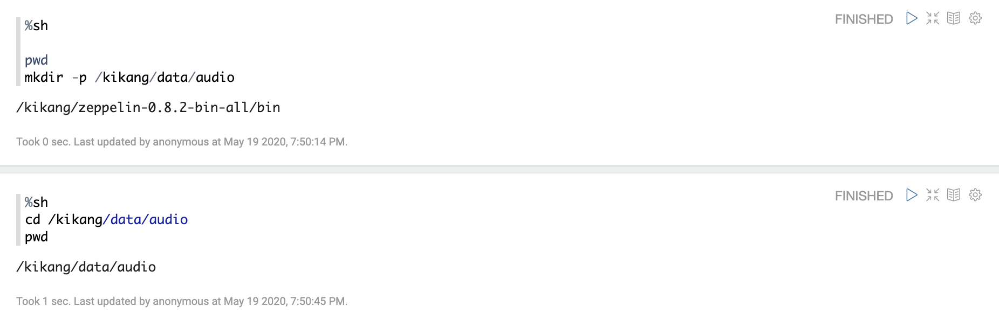

In [2]:
Image('./capture/reco_01.png')

In [ ]:
%sh
wget https://storage.googleapis.com/aas-data-sets/profiledata_06-May-2005.tar.gz

In [ ]:
mv ./profiledata_06-May-2005.tar.gz /kikang/data/audio/

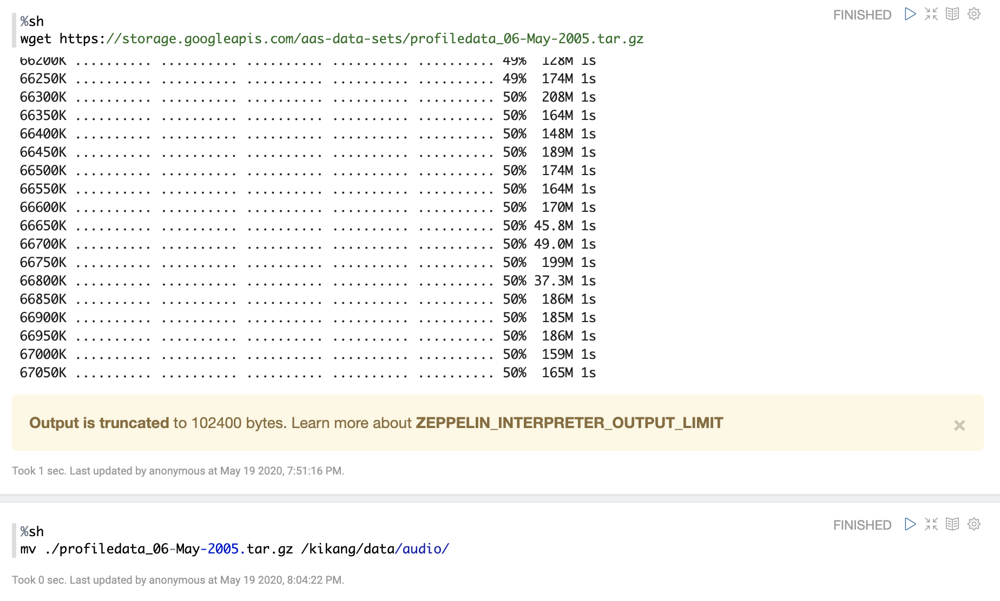

In [6]:
Image('./capture/reco_02.png')

In [ ]:
%sh
cd /kikang/data/audio
ls -al
tar xvfz ./profiledata_06-May-2005.tar.gz

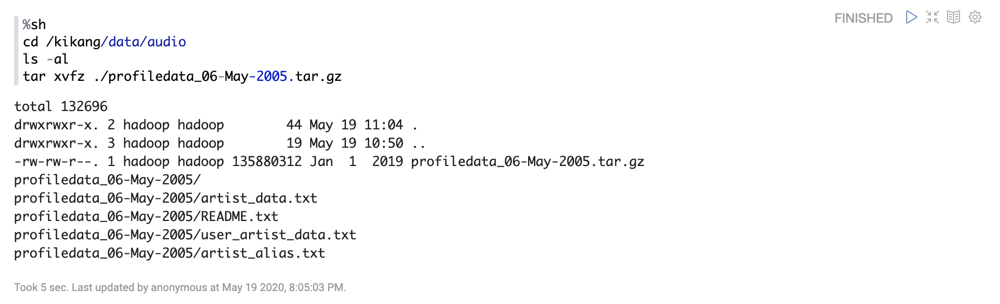

In [7]:
Image('./capture/reco_03.png')

In [ ]:
%sh

cd /kikang/data/audio/profiledata_06-May-2005
ls -alh
/kikang/hadoop3/bin/hdfs dfs -mkdir -p /kikang/data
/kikang/hadoop3/bin/hdfs dfs -put -d /kikang/data/audio /kikang/data/

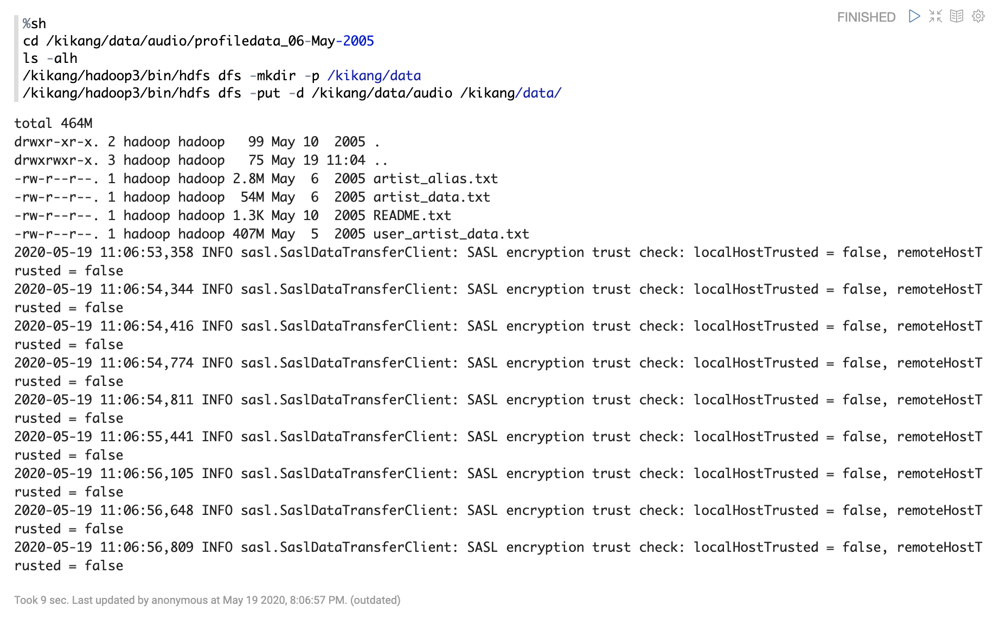

In [8]:
Image('./capture/reco_04.png')

-----
### 학습 데이터 탐색 및 정련

In [ ]:
val userArtistDF = spark.read.text("hdfs://hadoop-master-01:9000/kikang/data/audio/profiledata_06-May-2005/user_artist_data.txt")

- DataFrame = Dataset[Row]
- Row가 여기에서는 column 1개를 가지고 있다. --> column name : 'value'

In [ ]:
val userArtistDS = spark.read.textFile("hdfs://hadoop-master-01:9000/kikang/data/audio/profiledata_06-May-2005/user_artist_data.txt")

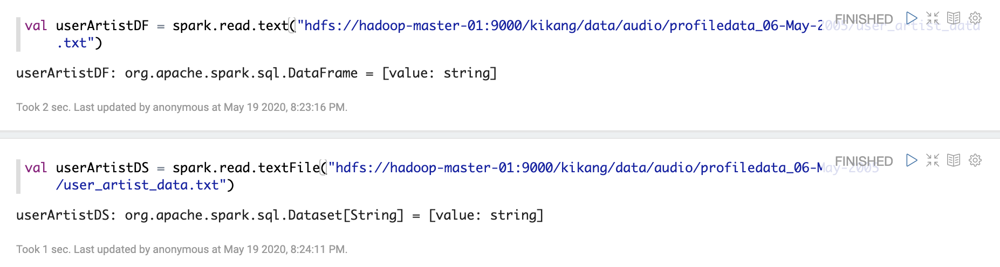

In [9]:
Image('./capture/reco_05.png')

In [ ]:
val userArtistDF2 = userArtistDF.map(x => x)

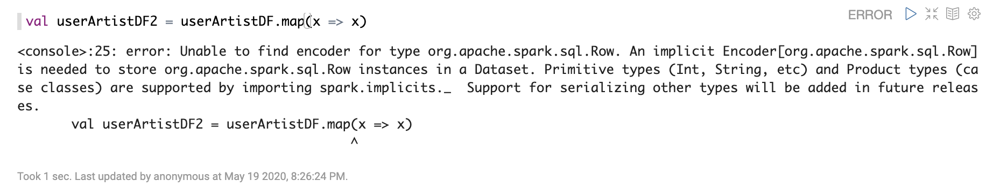

In [10]:
Image('./capture/reco_06.png')

## $\rightarrow $ 오류!

 - Encoder와 관련된 정보를 안주면 오류 발생.
 - 별도의 Encoder 지정이 필요.
 
  - Dataset[Row]
  - Row라는 객체에 Inplicit Encoder

In [ ]:
val userArtistDF2 = userArtistDF.map(row => row.getString(0))

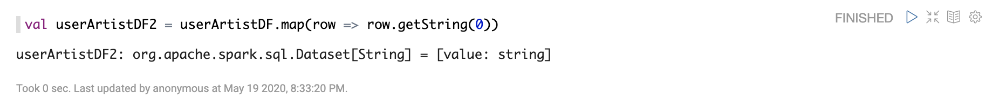

In [12]:
Image('./capture/reco_08.png')

In [ ]:
val userArtistDS2 = userArtistDS.map(x => x)

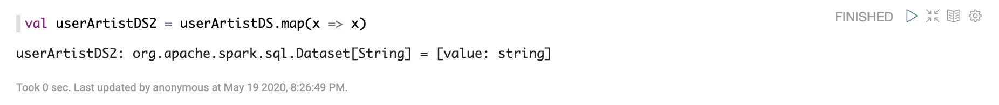

In [11]:
Image('./capture/reco_07.png')

In [ ]:
userArtistDS.count()

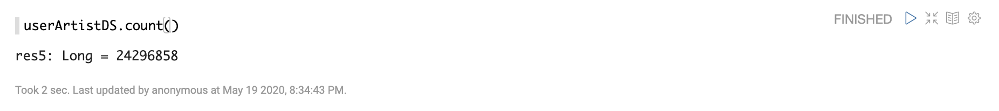

In [13]:
Image('./capture/reco_09.png')

In [ ]:
val userArtistCSVDF = spark
    .read
    .option("sep", " ")
    .csv("hdfs://hadoop-master-01:9000/kikang/data/audio/profiledata_06-May-2005/user_artist_data.txt")
    .toDF("userid", "artistid","playcount")

In [ ]:
userArtistCSVDF.show()

In [ ]:
userArtistDS.count() - userArtistCSVDF.count()

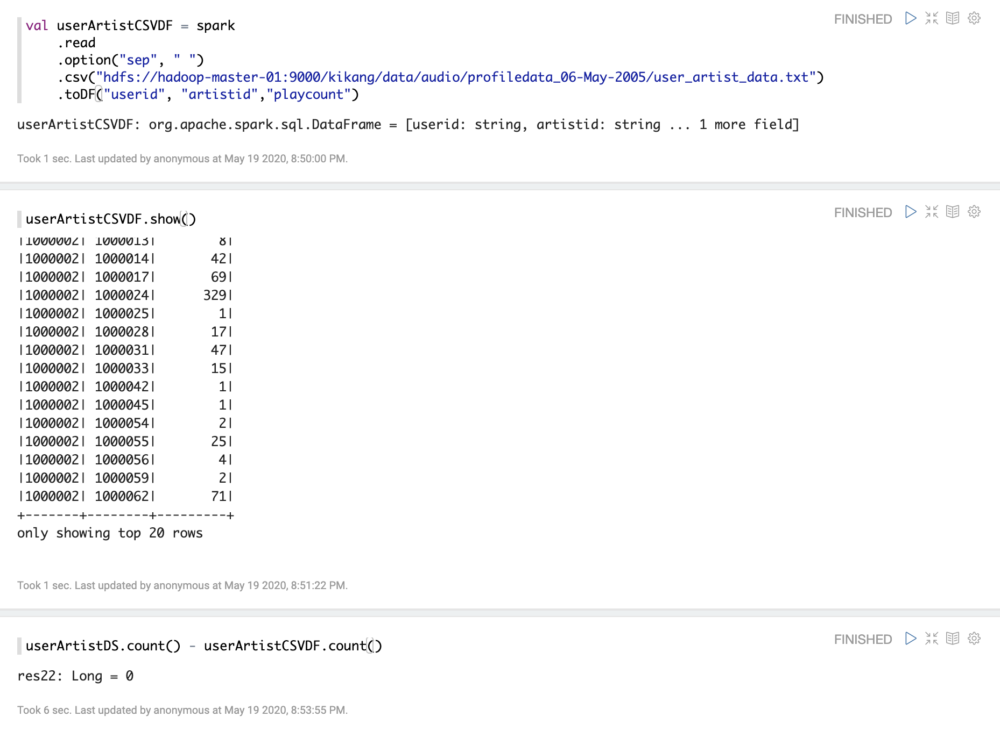

In [14]:
Image('./capture/reco_10.png')

In [ ]:
userArtistCSVDF
.describe()
.show()

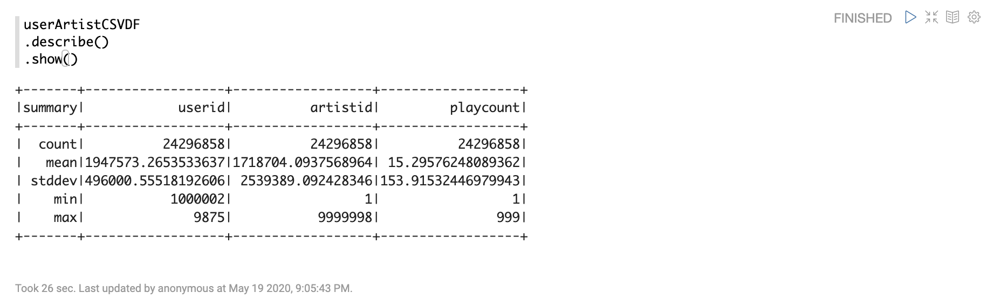

In [15]:
Image('./capture/reco_11.png')

In [ ]:
val userArtistCSVDF2 = userArtistCSVDF
    .selectExpr("cast(userid as int)", "cast(artistid as int)","cast(playcount as int)")

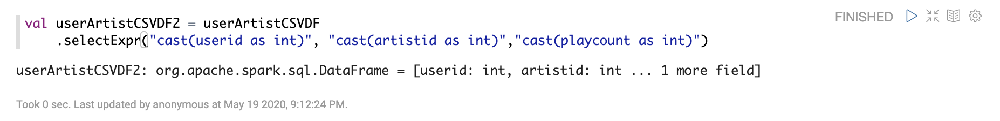

In [16]:
Image('./capture/reco_12.png')

In [ ]:
userArtistCSVDF2.printSchema()

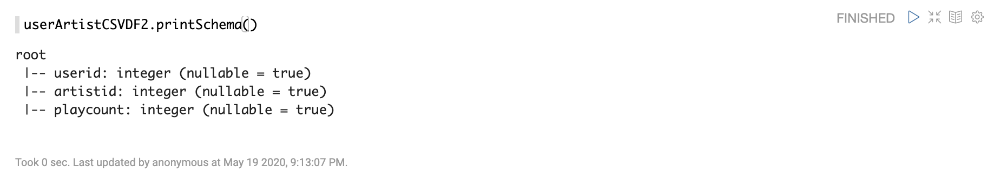

In [17]:
Image('./capture/reco_13.png')

In [ ]:
userArtistCSVDF2.describe().show()

In [ ]:
userArtistCSVDF2.summary().show()

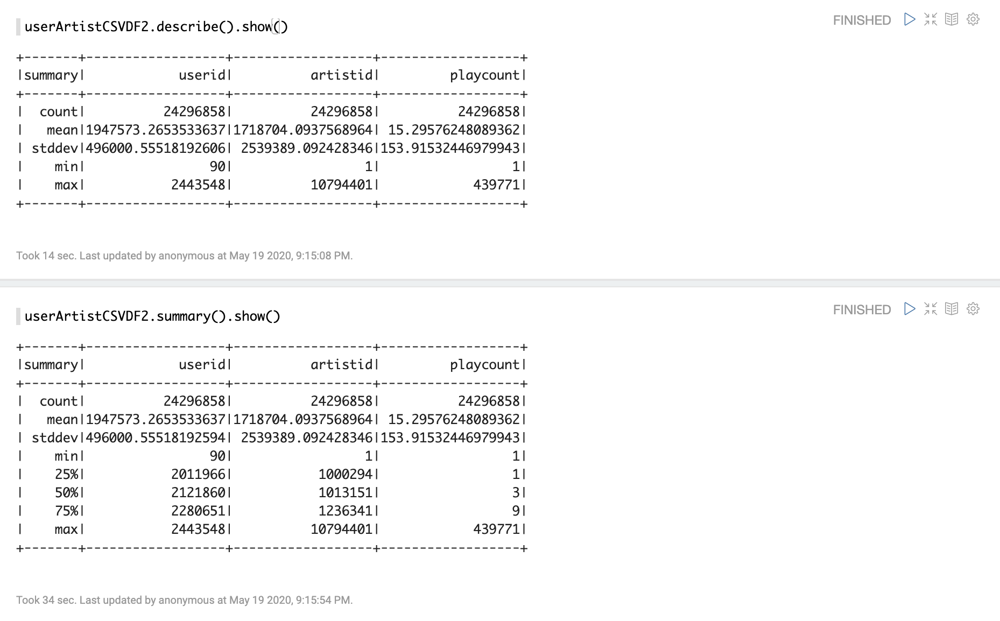

In [18]:
Image('./capture/reco_14.png')

In [ ]:
userArtistCSVDF2
    .where("playcount = 439771")
    .show()

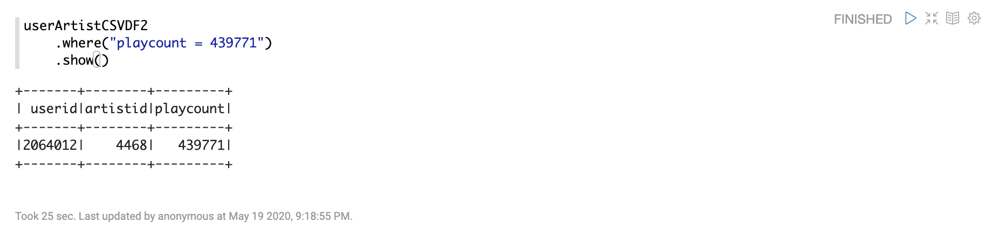

In [19]:
Image('./capture/reco_15.png')

In [ ]:
val artistDS = spark.read.textFile("hdfs://hadoop-master-01:9000/kikang/data/audio/profiledata_06-May-2005/artist_data.txt")

artistDS.show(false)
artistDS.printSchema()
artistDS.count()

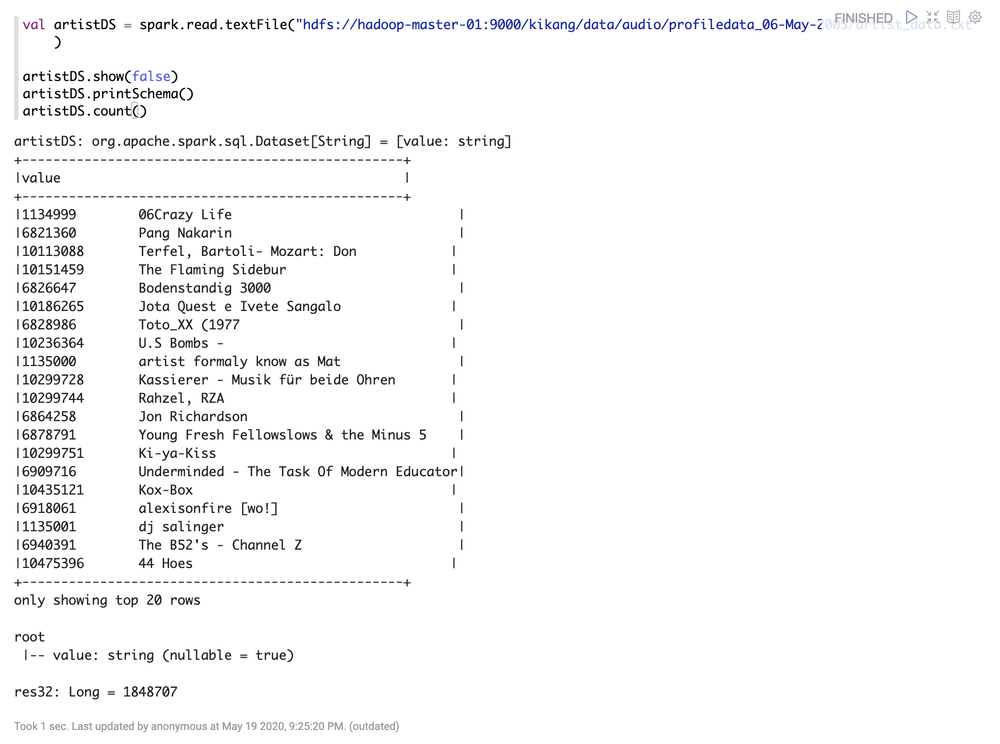

In [20]:
Image('./capture/reco_16.png')

### 아티스트 이름, CSV 포맷으로 읽기

In [ ]:
val artistDF = spark
    .read
    .option("sep","\t")
    .csv("hdfs://hadoop-master-01:9000/kikang/data/audio/profiledata_06-May-2005/artist_data.txt")

artistDF.printSchema()
artistDF.show(false)
artistDF.count()

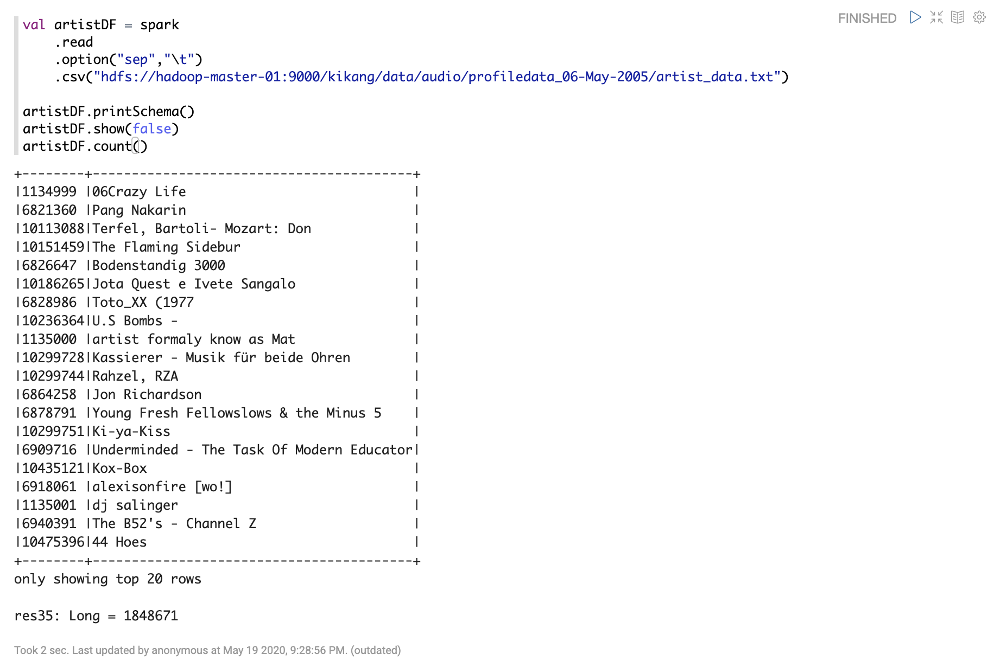

In [21]:
Image('./capture/reco_17.png')

In [ ]:
artistDS.count() - artistDF.count()

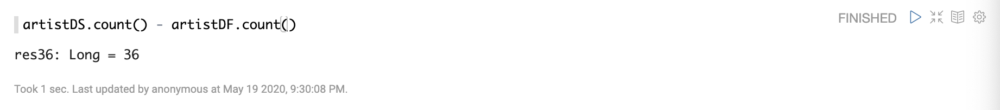

In [22]:
Image('./capture/reco_18.png')

In [ ]:
val artistDF = spark
    .read
    .option("sep","\t")
    .option("inferSchema", true)
    .csv("hdfs://hadoop-master-01:9000/kikang/data/audio/profiledata_06-May-2005/artist_data.txt")
    .toDF("artistid", "artistname")
    
artistDF.printSchema()
artistDF.show(false)
artistDF.count()

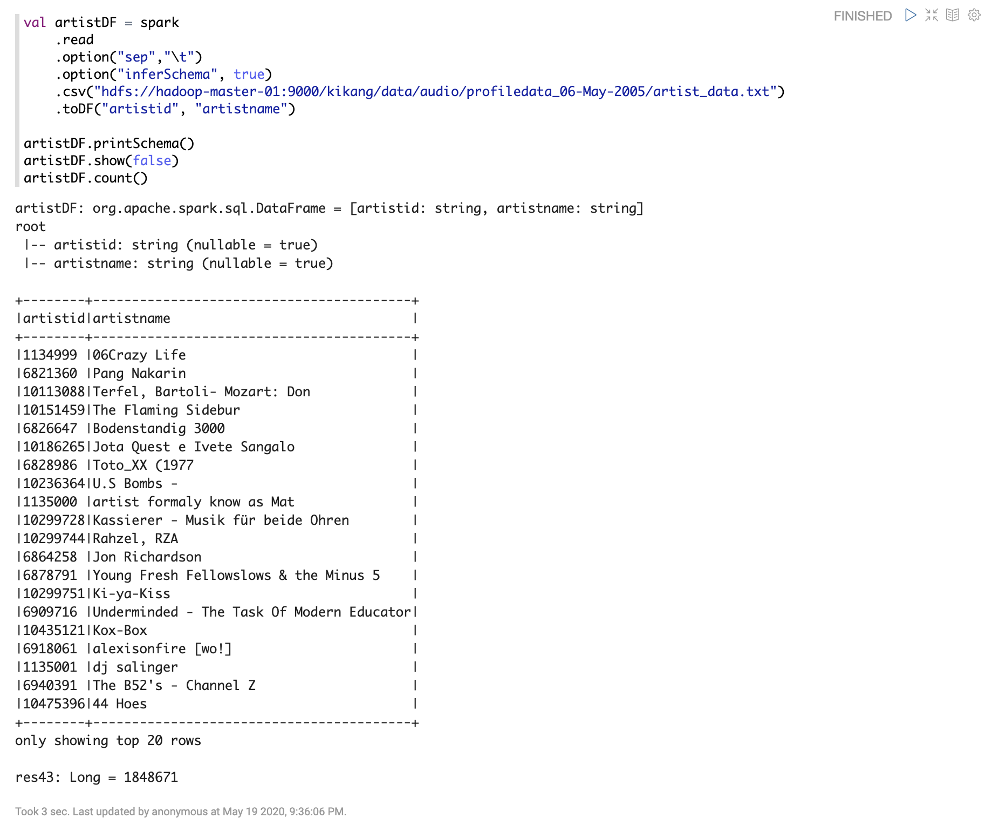

In [23]:
Image('./capture/reco_19.png')

In [ ]:
artistDF.summary().show()

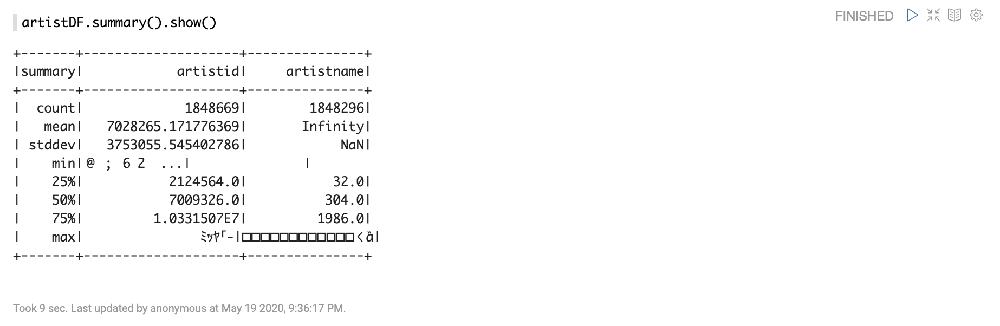

In [24]:
Image('./capture/reco_20.png')

### 오류성 데이터 확인 (by. artistid)

In [ ]:
artistDF.filter(row => {
    val artistid = row.getString(0)
    val artistname = row.getString(1)
    try{
        artistid.toInt
        false
    }catch {
        case e:Exception => true
    }
}).show(false)

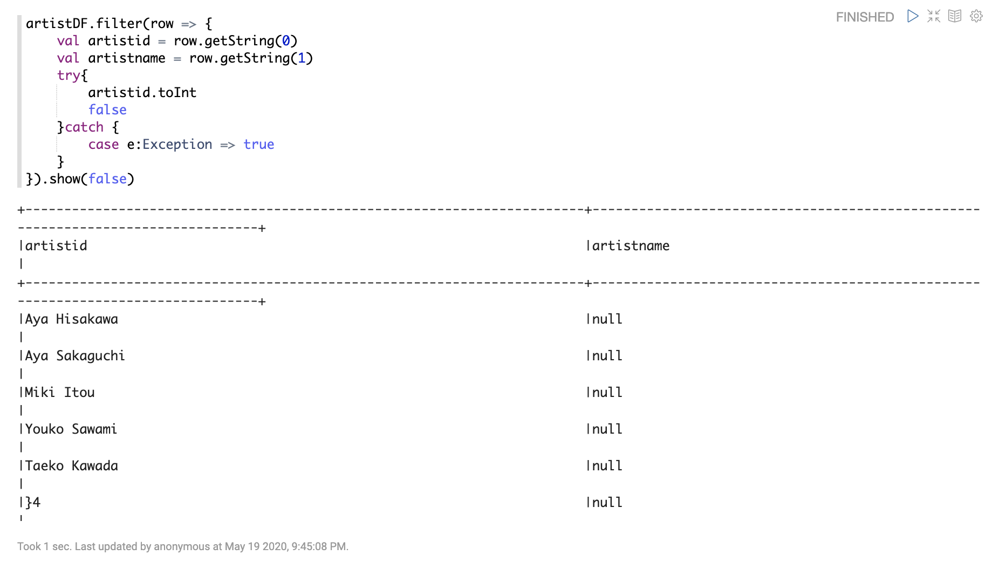

In [25]:
Image('./capture/reco_21.png')

val artistDF2 = artistDF.filter(row => {
    val artistid = row.getString(0)
    val artistname = row.getString(1)
    try{
        artistid.toInt
        true
    }catch {
        case e:Exception => true
    }
})

### 오류 데이터 제거

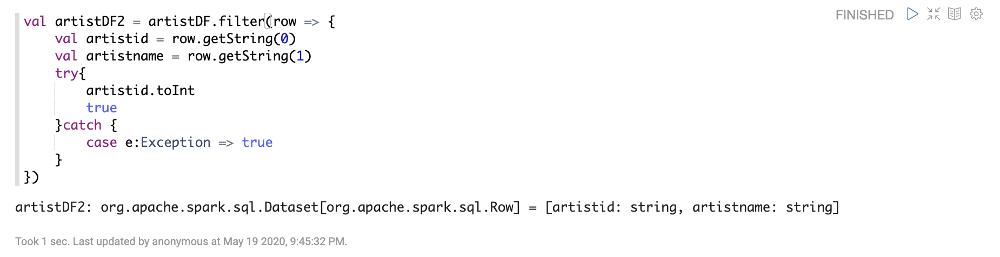

In [26]:
Image('./capture/reco_22.png')

In [ ]:
artistDF2.show(false)
artistDF2.count()

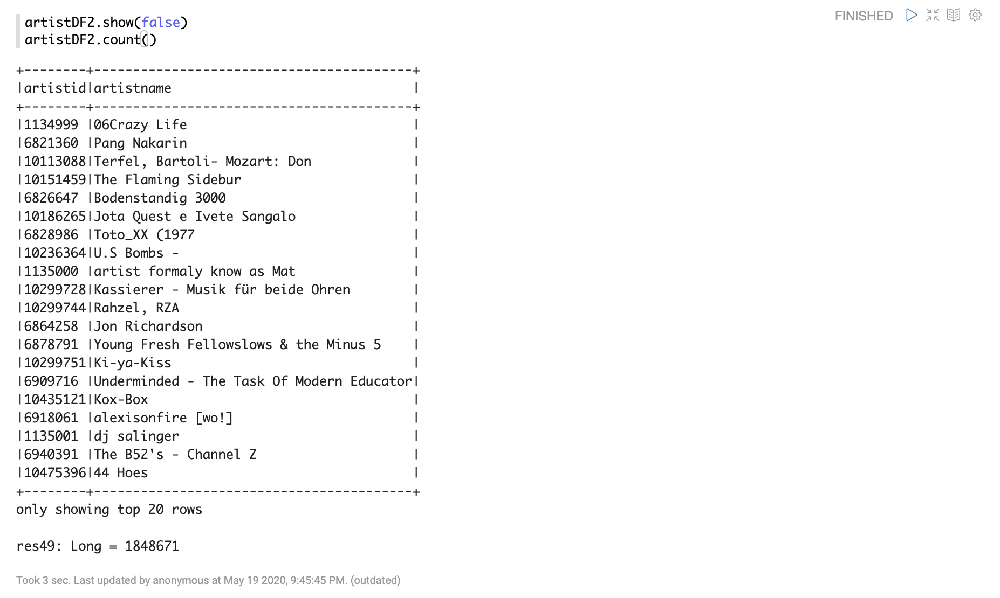

In [27]:
Image("./capture/reco_23.png")

In [ ]:
val artistDF2 = artistDF.filter(row => {
    val artistid = row.getString(0)
    val artistname = row.getString(1)
    try{
        artistid.toInt
        true
    }catch {
        case e:Exception => true
    }
}).where("artistid is not null") # null값 데이터 확인
.where("artistname is not null")

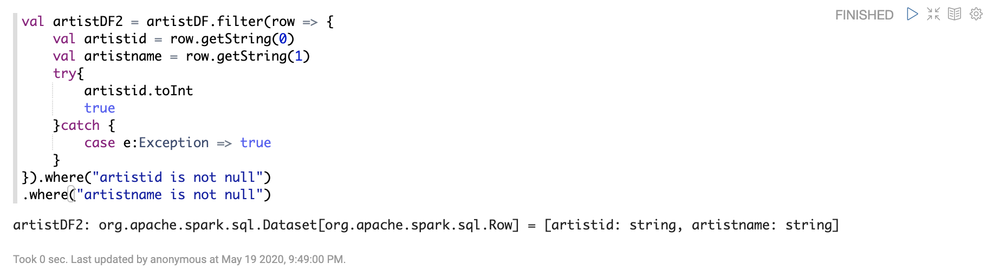

In [28]:
Image('./capture/reco_24.png')

In [ ]:
artistDF2.summary().show()

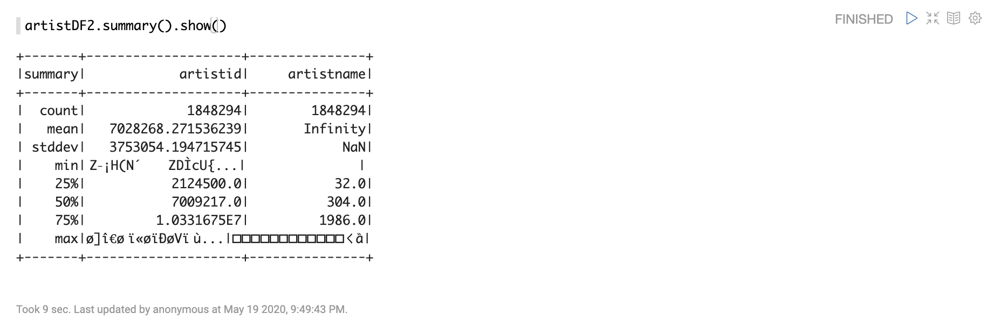

In [29]:
Image('./capture/reco_25.png')

In [ ]:
val artistDF2 = artistDF.filter(row => {
    val artistid = row.getString(0)
    val artistname = row.getString(1)
    try{
        artistid.toInt
        true
    }catch {
        case e:Exception => true
    }
}).where("artistid is not null")
.where("artistname is not null")
.select(expr("cast(artistid as Int)"), $"artistname")

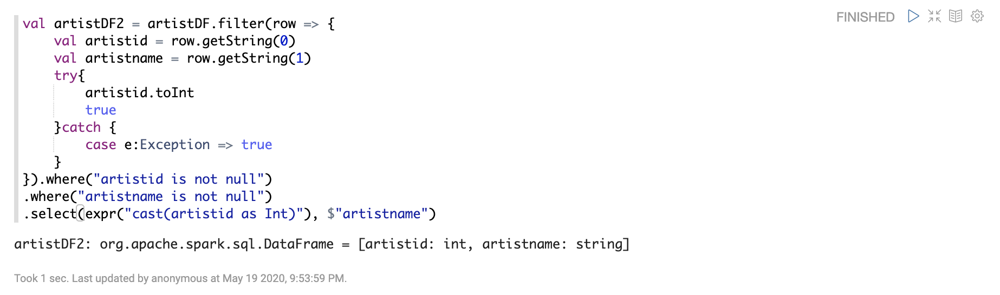

In [30]:
Image('./capture/reco_26.png')

In [ ]:
artistDF2.show(false)
artistDF2.count()

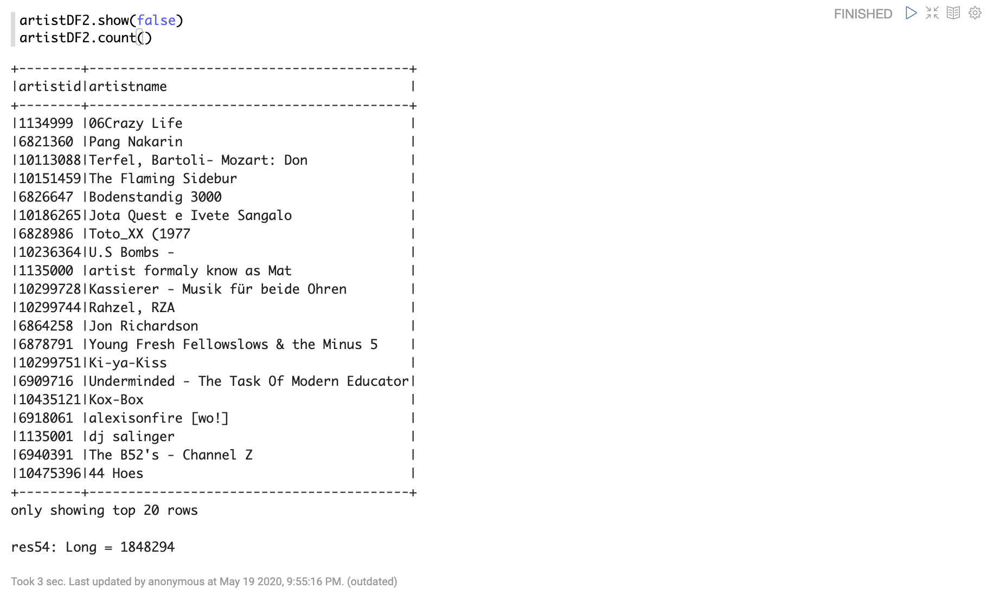

In [31]:
Image('./capture/reco_27.png')

In [ ]:
val artistDF2 = artistDF.filter(row => {
    val artistid = row.getString(0)
    val artistname = row.getString(1)
    try{
        artistid.toInt
        true
    }catch {
        case e:Exception => true
    }
}).where("artistid is not null")
.where("artistname is not null")
.withColumn("artistid", expr("cast(artistid as Int"))

In [ ]:
artistDF2.show(false)
artistDF2.count()

In [ ]:
artistDF2.summary().show()

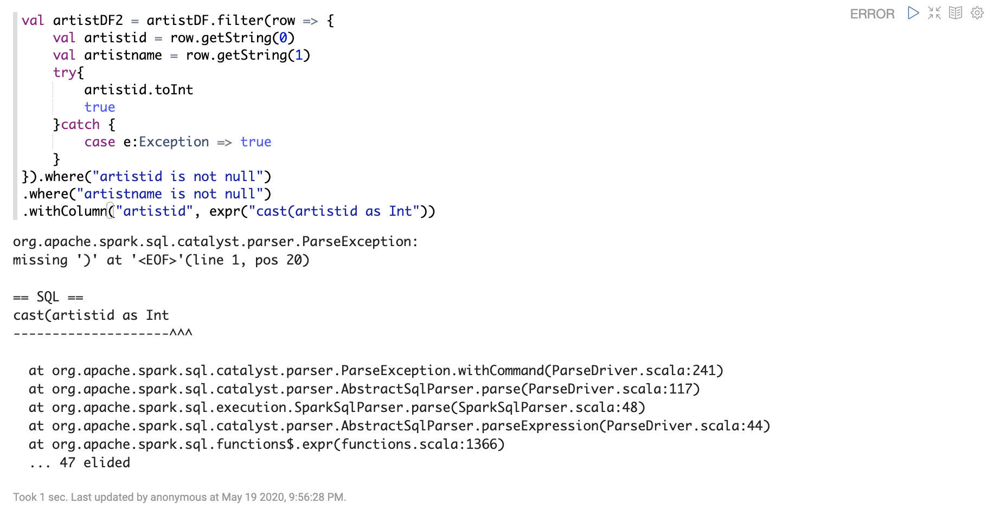

In [32]:
Image('./capture/reco_28.png')

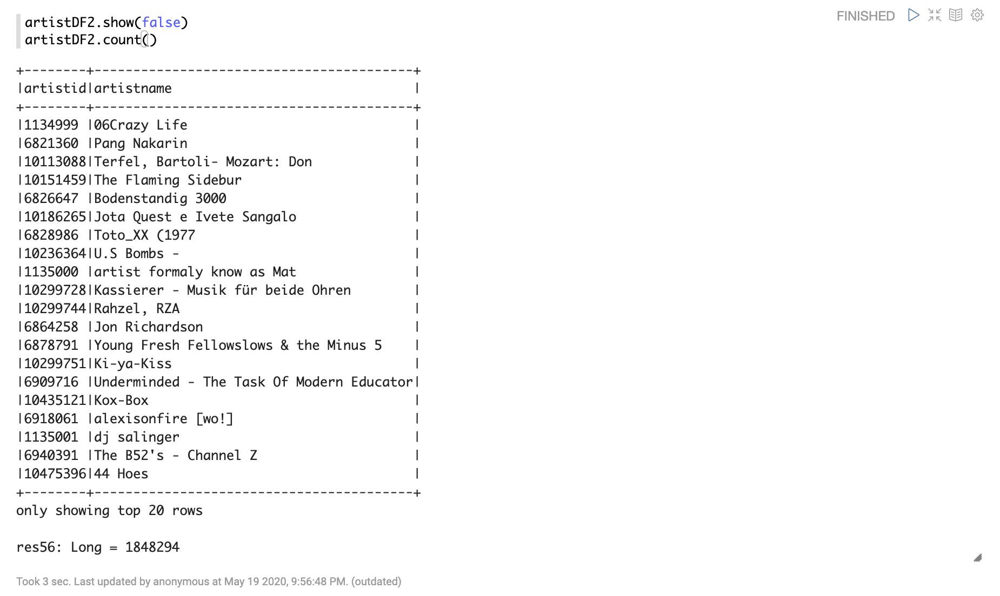

In [33]:
Image('./capture/reco_29.png')

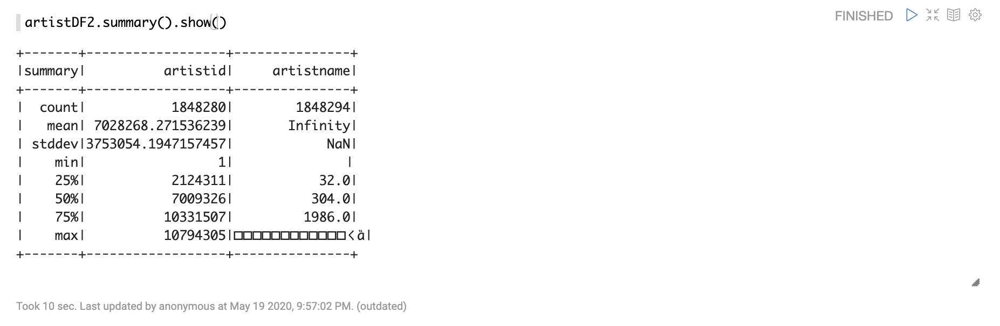

In [34]:
Image('./capture/reco_30.png')

In [ ]:
val artistAliasDS = spark.read.textFile("hdfs://hadoop-master-01:9000/kikang/data/audio/profiledata_06-May-2005/artist_alias.txt")

artistAliasDS.show(false)
artistAliasDS.printSchema()
artistAliasDS.count()

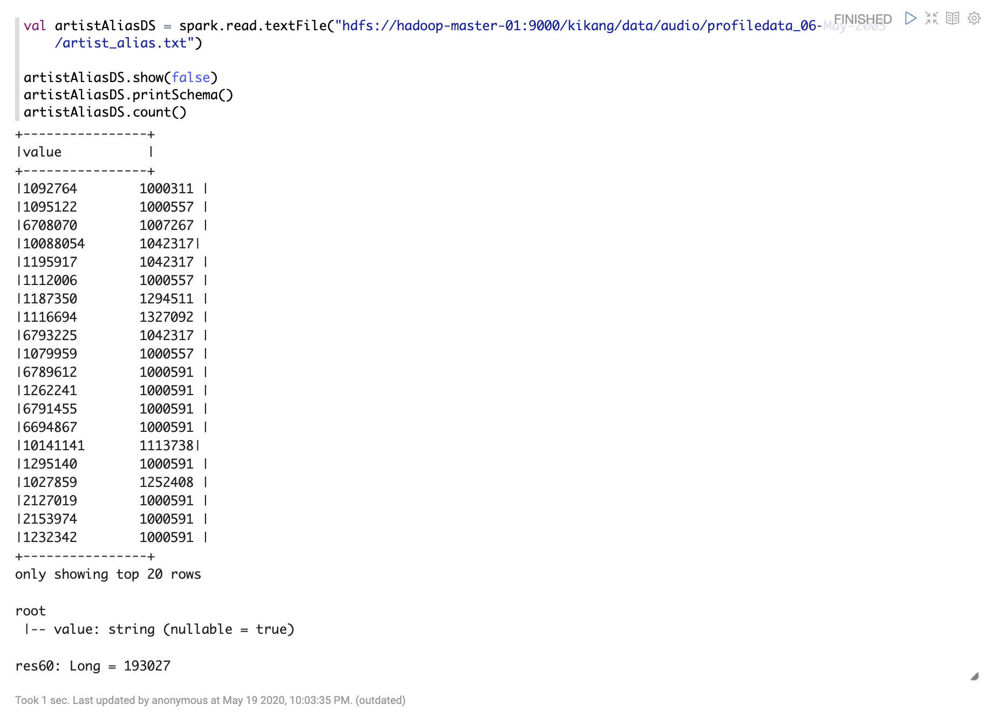

In [35]:
Image('./capture/reco_31.png')

### BadID , GoodID

In [ ]:
val artistAliasDF = spark
    .read
    .option("sep","\t")
    .option("inferSchema", true)
    .csv("hdfs://hadoop-master-01:9000/kikang/data/audio/profiledata_06-May-2005/artist_alias.txt")
    .toDF("badid", "goodid")

artistAliasDF.printSchema()
artistAliasDF.show(false)
artistAliasDF.count()

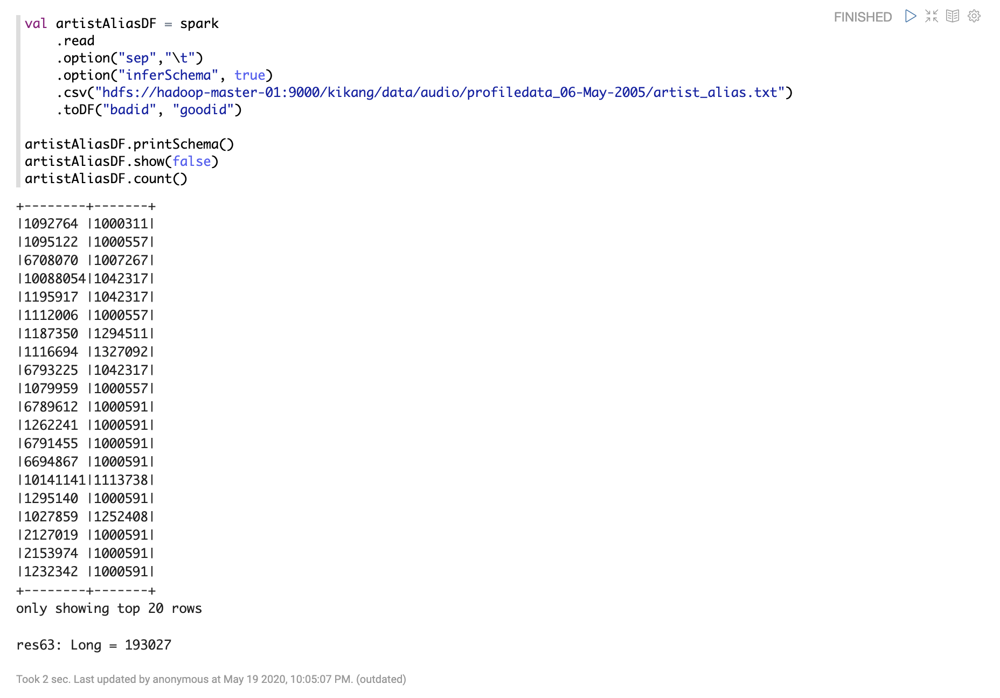

In [36]:
Image('./capture/reco_32.png')

In [ ]:
artistAliasDF.summary().show()

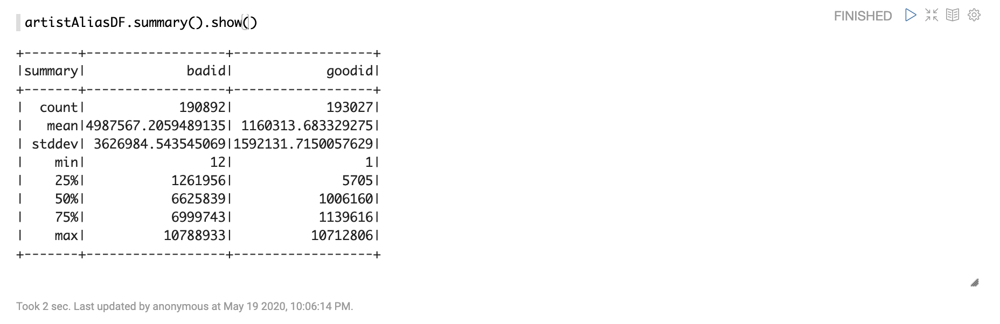

In [37]:
Image('./capture/reco_33.png')

### Null 값 확인

In [ ]:
artistAliasDF.filter("badid is null").show(false)
artistAliasDF.filter("goodid is null").show(false)

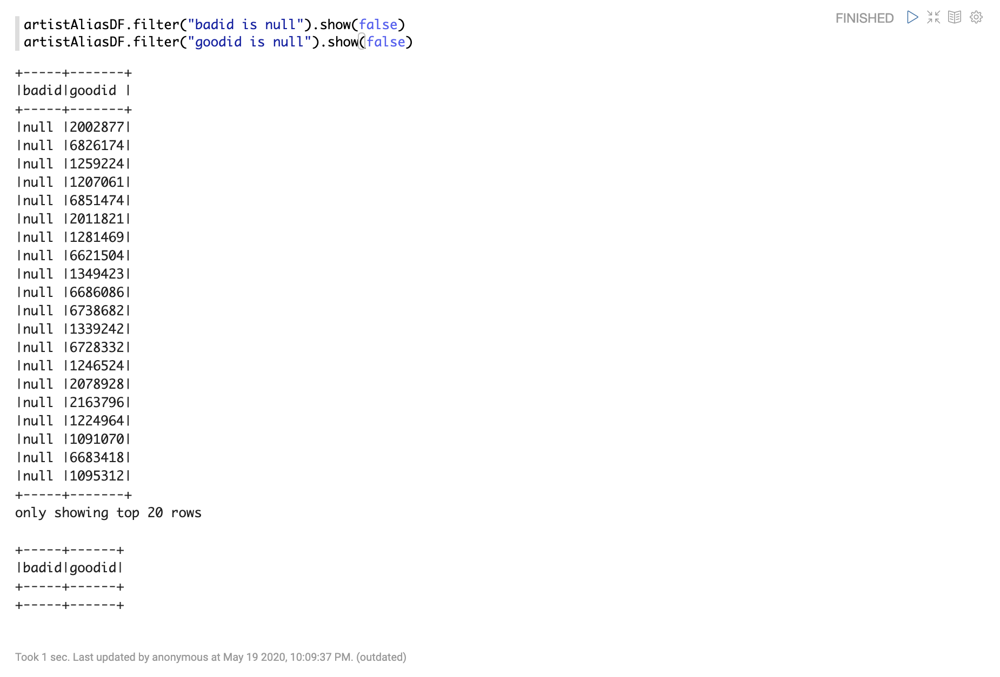

In [38]:
Image('./capture/reco_34.png')

### 데이터에서 Null 제거

In [ ]:
val artistAliasDF2 = artistAliasDF
    .filter("badid is not null")
    .filter("goodid is not null")

artistAliasDF.printSchema()
artistAliasDF.show(false)
artistAliasDF.count()

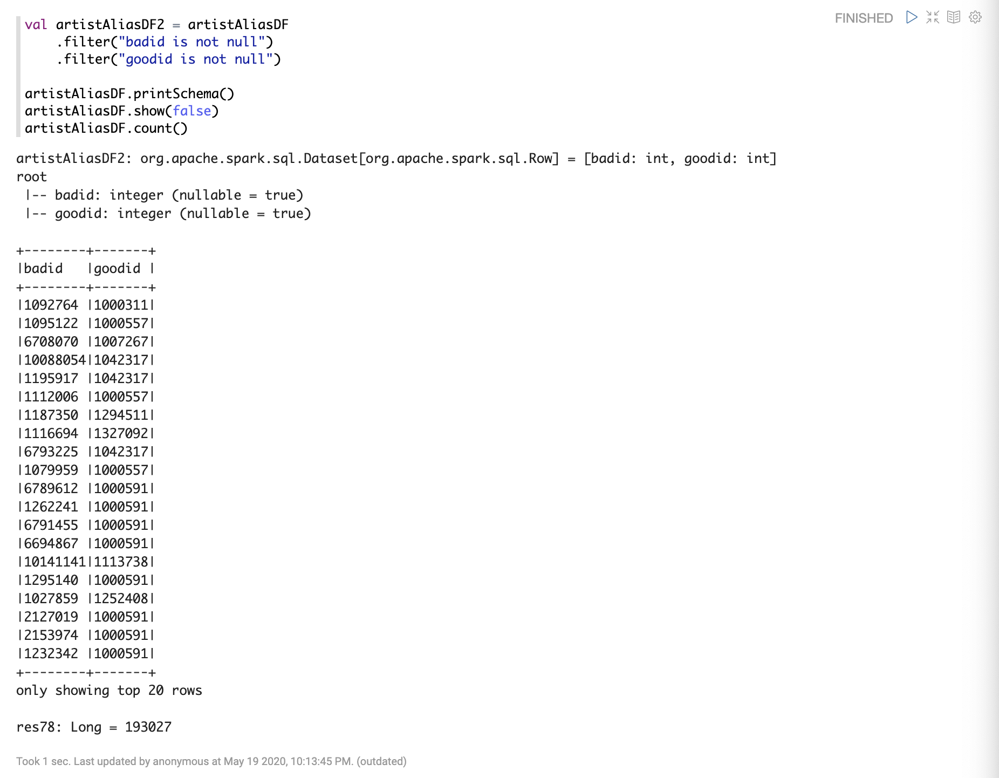

In [39]:
Image('./capture/reco_35.png')

In [ ]:
artistAliasDF2.summary().show()

### 정련된 데이터 건수 확인

In [ ]:
artistAliasDS.count() - artistAliasDF2.count()

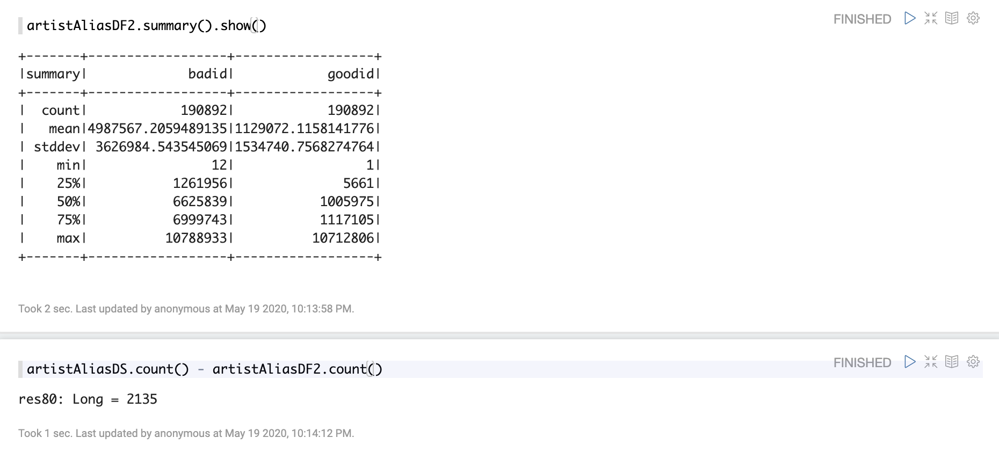

In [40]:
Image('./capture/reco_36.png')

-----
 
- user_artist_data에 있는 BadID, GoodID 제거


### 최대 얼마동안 들은 경우만 허용

 - 최대 : 6개월
 - 최대 카운트 값 : 64800

In [ ]:
6 * 30 * 24 * 60 / 4

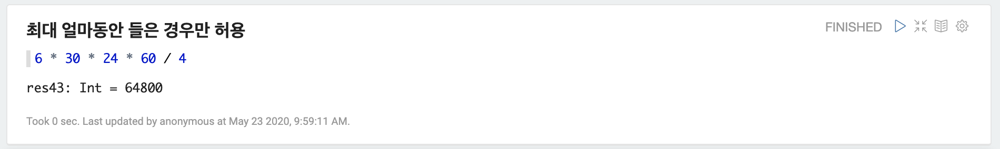

In [3]:
Image('./capture/01_reco.png')


### 특이값(노이즈로 추정) 확인

In [ ]:
userArtistCSVDF2
    .where("playcount = 439771")
    .show()

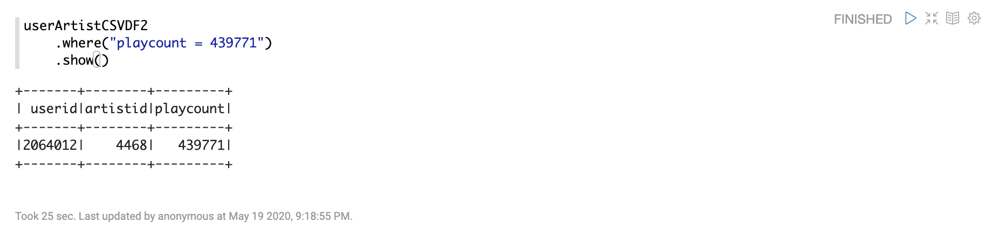

In [2]:
Image('./capture/reco_15.png')

In [ ]:
val userArtistCSVDF3 = userArtistCSVDF2
    .filter("playcount <= 64800")
    
userArtistCSVDF2.count() - userArtistCSVDF3.count()

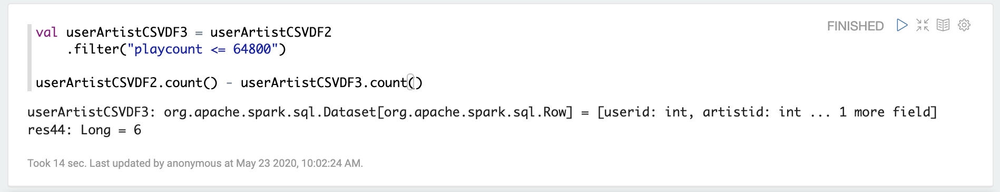

In [4]:
Image('./capture/02_reco.png')

### BadID를 GoodID로 변경

In [ ]:
userArtistCSVDF3.printSchema()
artistAliasDF2.printSchema()

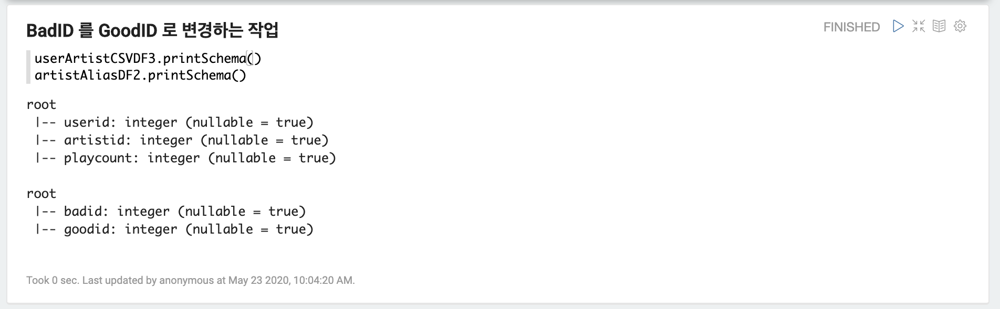

In [5]:
Image('./capture/03_reco.png')

In [ ]:
userArtistCSVDF3.createOrReplaceTempView("userArtistCSVDF3")
artistAliasDF2.createOrReplaceTempView("artistAliasDF2")

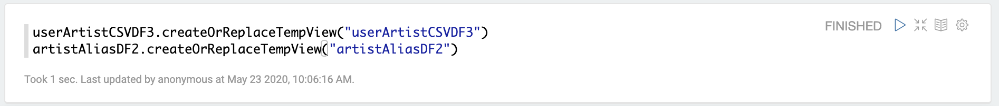

In [6]:
Image('./capture/04_reco.png')

In [ ]:
%sql

select 
    *
from 
    userArtistCSVDF3
where 
    true

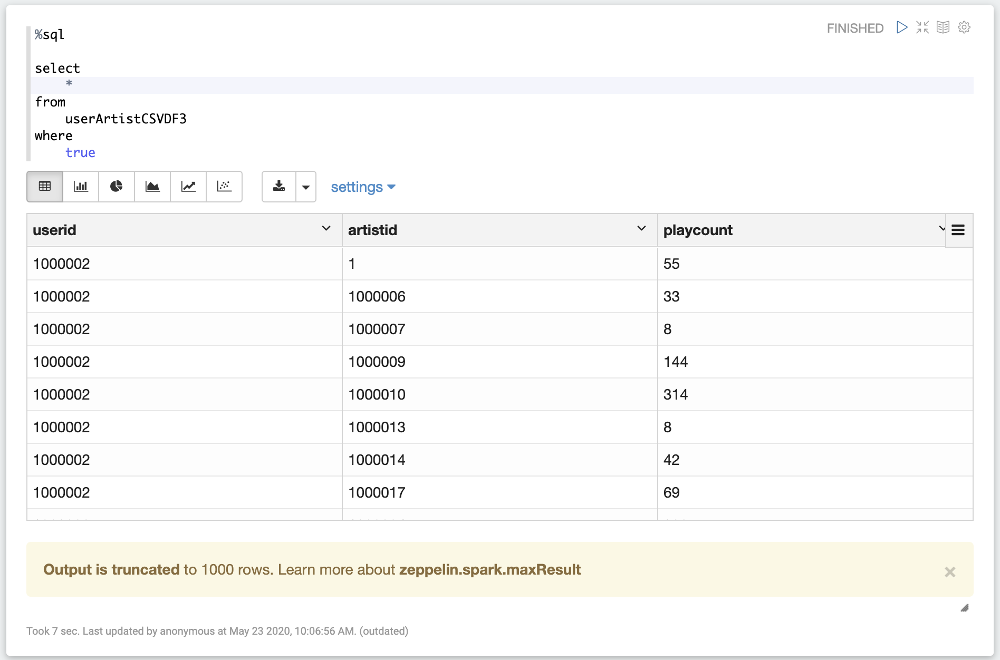

In [7]:
Image('./capture/05_reco.png')

In [ ]:
artistAliasDF2.count()
artistAliasDF2.select(expr("count(distinct(badid))")).show()

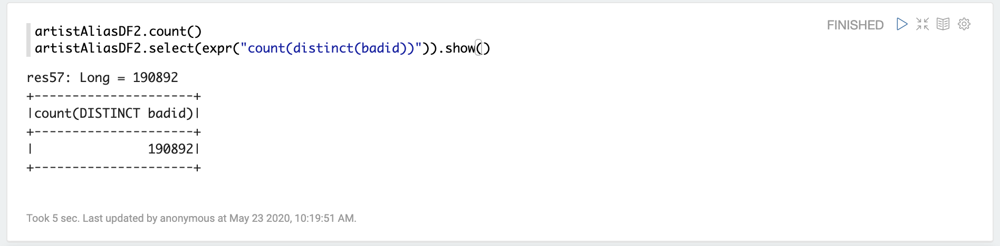

In [10]:
Image('./capture/06_reco.png')

In [ ]:
%sql

select 
    *
from 
    userArtistCSVDF3 uA
    left outer join
    artistAliasDF2 aA
    on 
     uA.artistid = aA.badid
where
    true

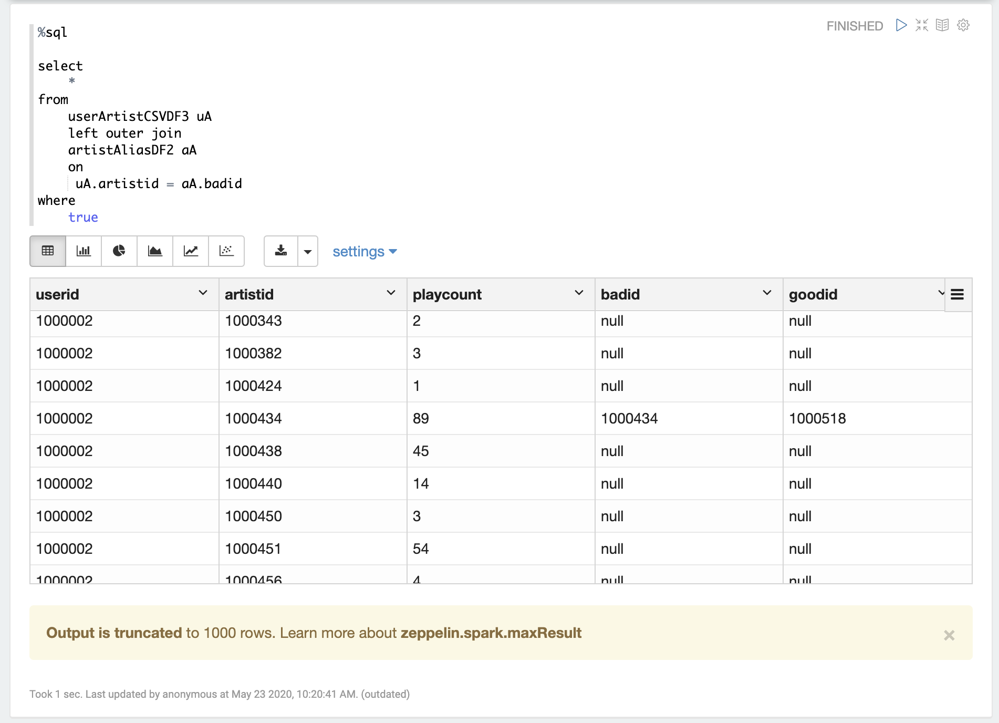

In [11]:
Image('./capture/07_reco.png')

In [ ]:
%sql

select 
    *
from 
    userArtistCSVDF3 uA
    left outer join
    artistAliasDF2 aA
    on 
     uA.artistid = aA.badid
where
    true
    
and aA.badid is not null

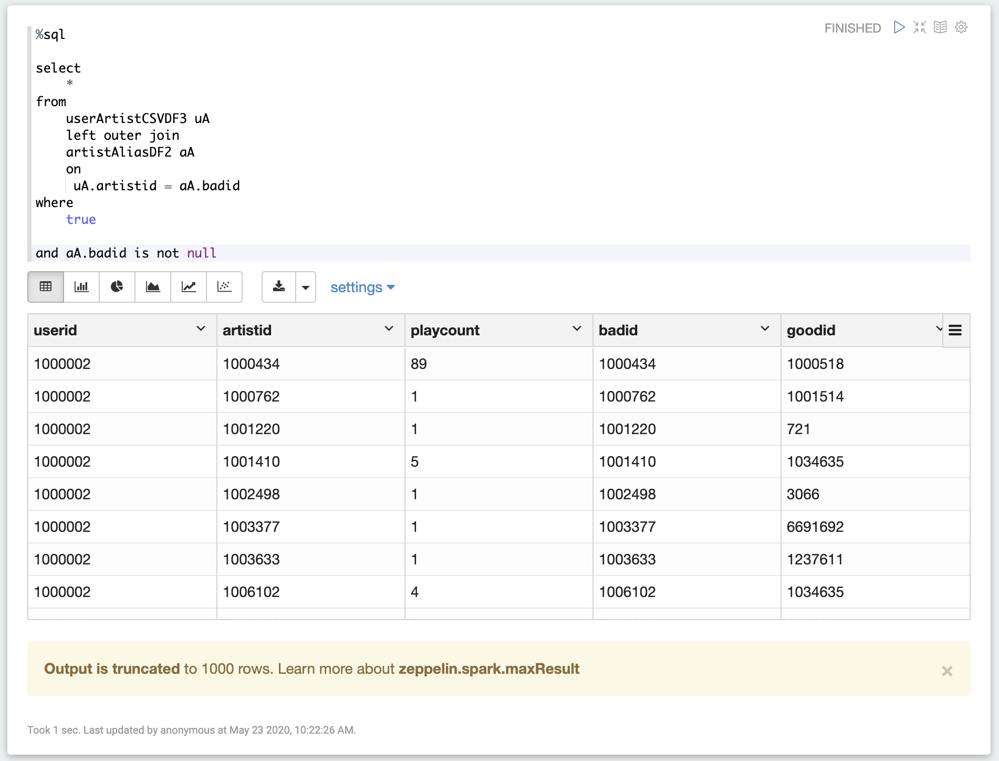

In [12]:
Image('./capture/08_reco.png')

In [ ]:
%sql

select 
      uA.*
    , aA.*
    , case
        when aA.badid is not null then aA.goodid 
        else uA.artistid
      end
      as artistid2
from 
    userArtistCSVDF3 uA
    left outer join
    artistAliasDF2 aA
    on 
     uA.artistid = aA.badid
where
    true

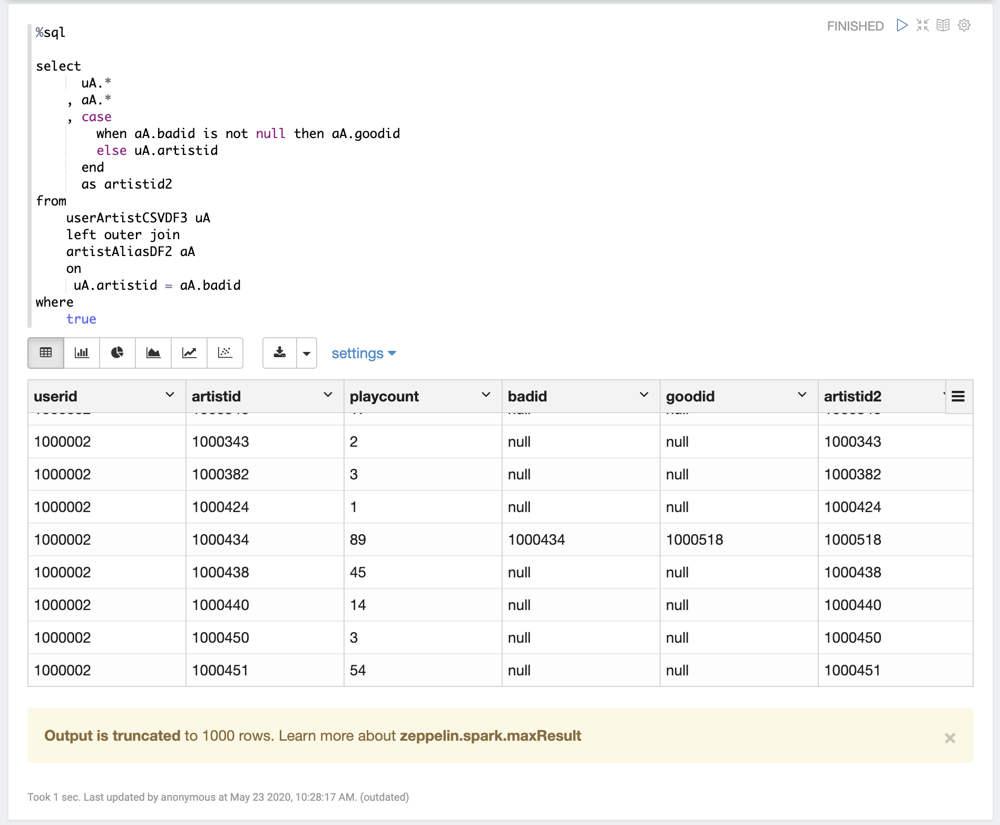

In [13]:
Image('./capture/09_reco.png')

In [ ]:
# 아직 함수가 없음 

artistAliasDF2.selectExpr(distinct($"badid"))
artistAliasDF2.selectExpr("distinct(badid)")

In [ ]:
artistAliasDF2.select(countDistinct("badid")).show()

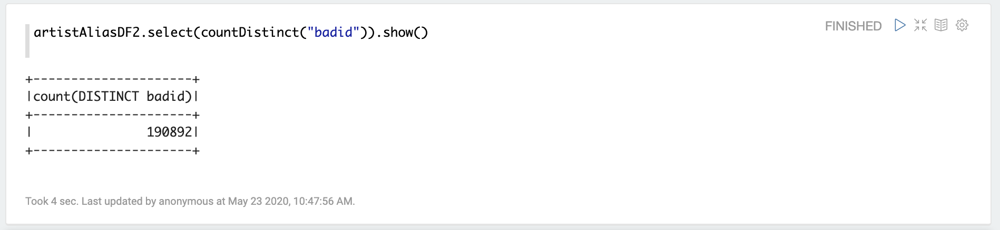

In [19]:
Image('./capture/11_reco.png')

In [ ]:
%sql
select
    DISTINCT(badid)
from
    artistAliasDF2

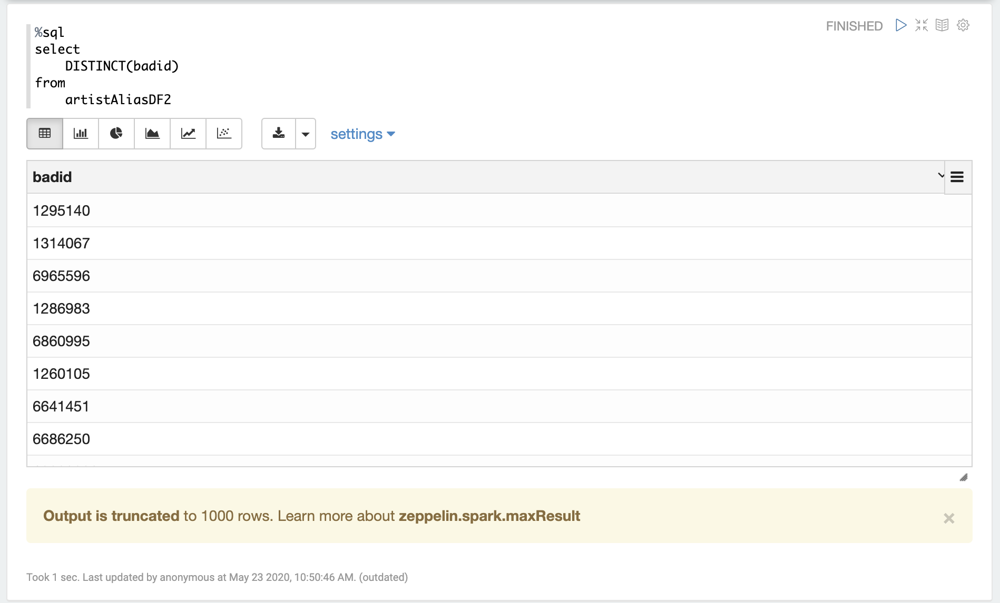

In [20]:
Image('./capture/12_reco.png')

In [ ]:
spark.sql("select distinct(badid) from artistAliasDF2").show()

In [ ]:
Image('./capture/13_reco.png')

### 결과 확인 --> 학습필요

In [ ]:
%sql

select 
      uA.userid
    , case
        when aA.badid is not null then aA.goodid 
        else uA.artistid
      end
      as artistid2
    , uA.playcount
from 
    userArtistCSVDF3 uA
    left outer join
    artistAliasDF2 aA
    on 
     uA.artistid = aA.badid
where
    true

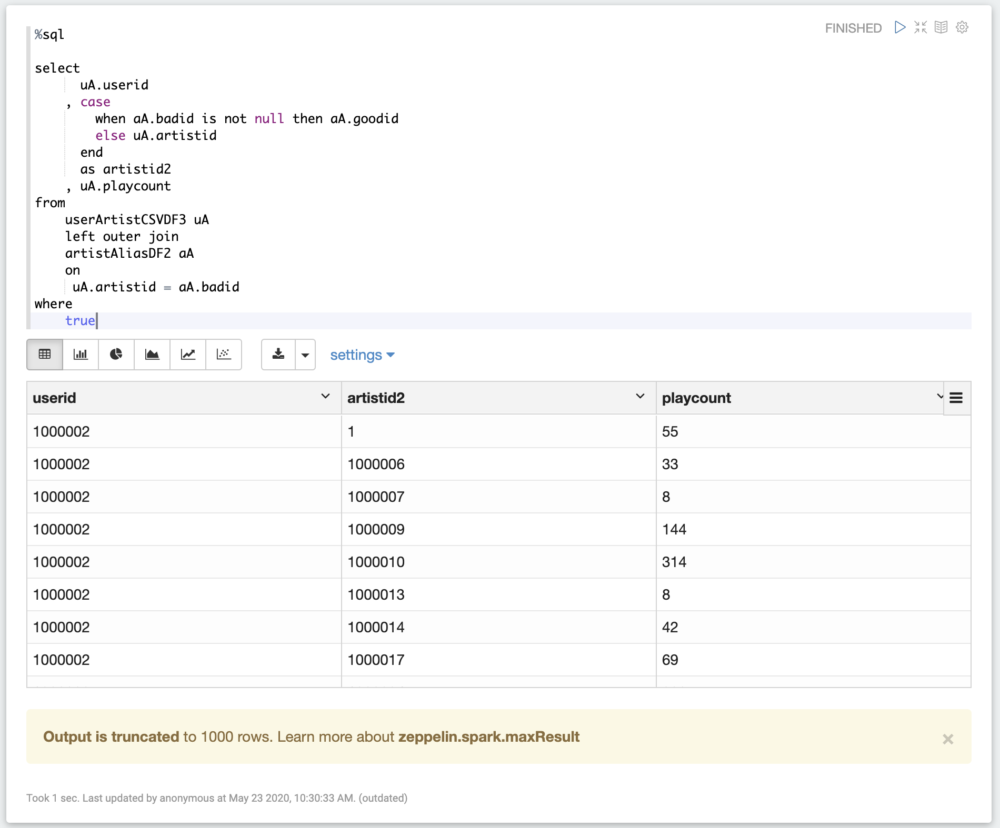

In [14]:
Image('./capture/10_reco.png')

In [ ]:
val userArtistCSVDF4 = spark.sql("""

    select 
          uA.userid
        , case
            when aA.badid is not null then aA.goodid 
            else uA.artistid
          end
          as artistid2
        , uA.playcount
    from 
        userArtistCSVDF3 uA
        left outer join
        artistAliasDF2 aA
        on 
         uA.artistid = aA.badid
    where
        true
        
""")

userArtistCSVDF4.printSchema()
userArtistCSVDF4.show()

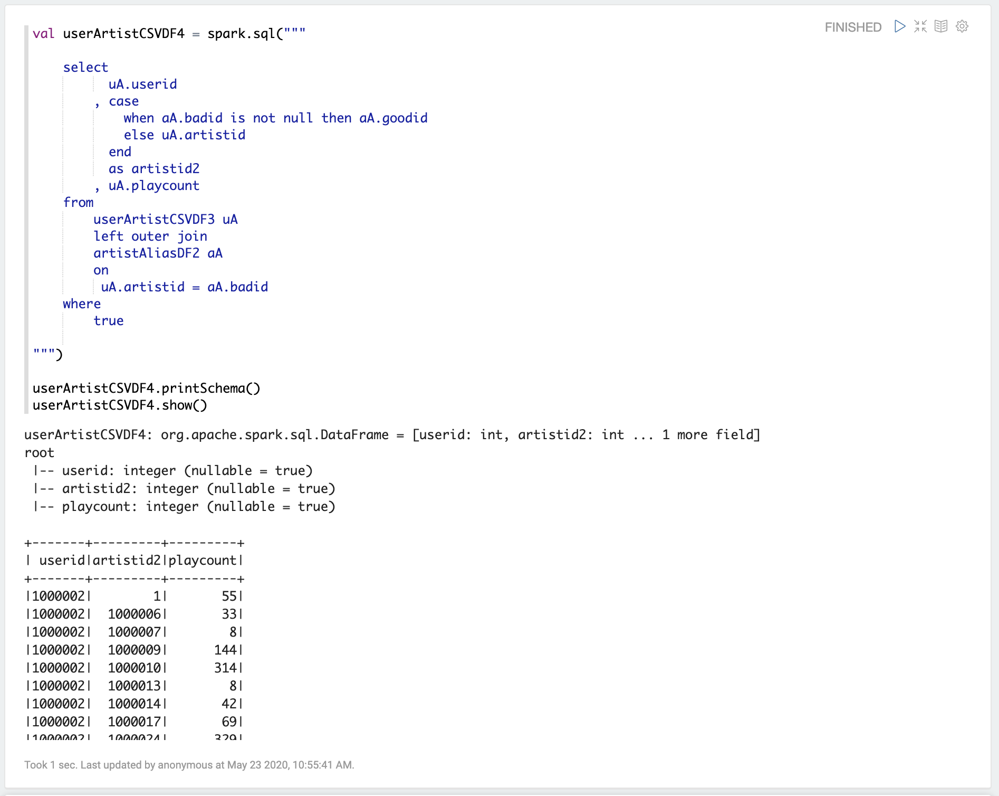

In [18]:
Image('./capture/14_reco.png')

### SQL query --> DataFrame API


##### sql join
 - inner
 - cross 
 - outer 
 - full  
 - full_outer
 - left
 - left_outer
 - right
 - right_outer
 - left_semi
 - left_anti

In [ ]:
val userArtistCSVDF5 = userArtistCSVDF3.as("uA")
    .join(artistAliasDF2.as("aA"), $"uA.artistid" === $"aA.badid", "left_outer")

userArtistCSVDF5.show()

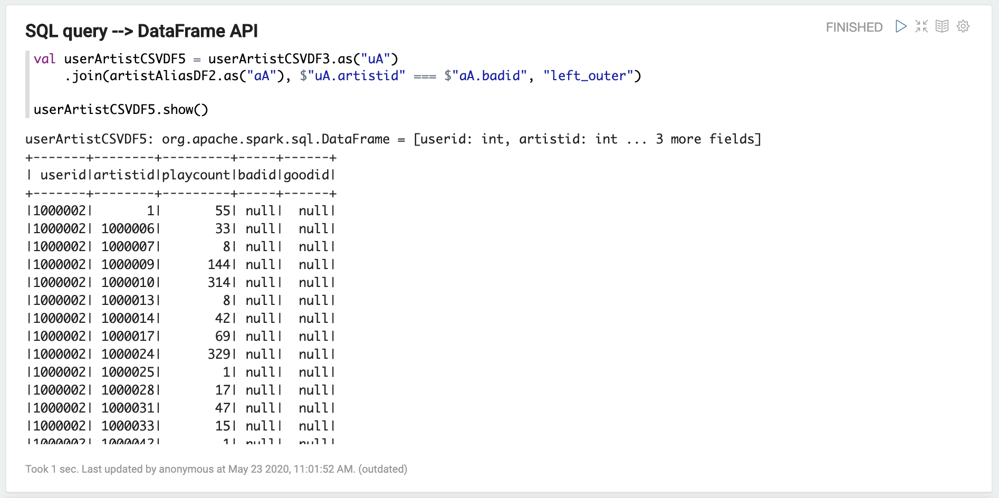

In [21]:
Image('./capture/15_reco.png')

In [ ]:
val userArtistCSVDF5 = userArtistCSVDF3.as("uA")
    .join(artistAliasDF2.as("aA"), $"uA.artistid" === $"aA.badid", "left_outer")
#    .withColumns("artistid2", case when $"aA.badid" is not null then $"aA.goodid" else $"uA.artistid" end) -- 지원안함

userArtistCSVDF5.show()

### BadID 를 GoodID로 바꾼 최종 데이터

In [ ]:
val userArtistCSVDF5 = userArtistCSVDF3.as("uA")
    .join(artistAliasDF2.as("aA"), $"uA.artistid" === $"aA.badid", "left_outer")
    .withColumn("artistid2", expr("case when aA.badid is not null then aA.goodid else uA.artistid end"))
    .select('userid, 'artistid2.as("artistid") ,'playcount)

userArtistCSVDF5.show()

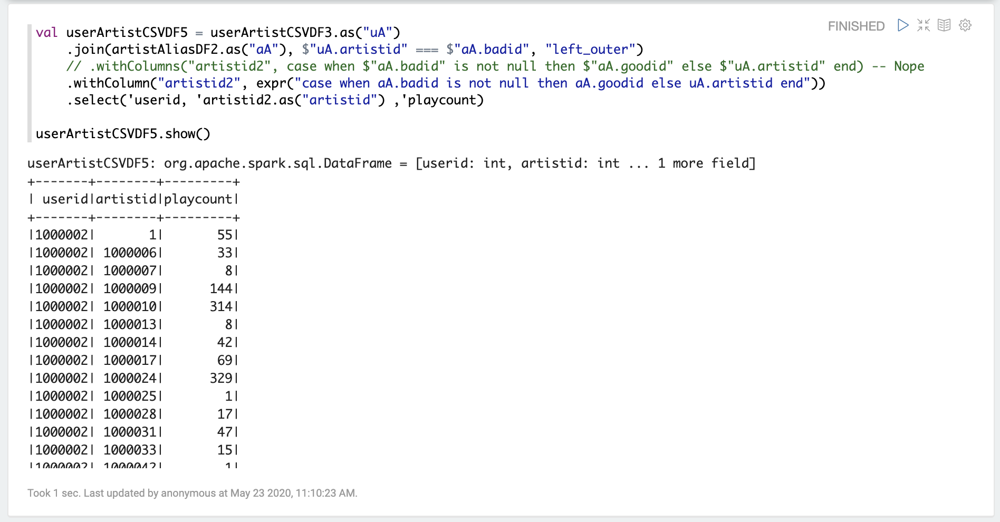

In [22]:
Image('./capture/16_reco.png')

-----

In [ ]:
import org.apache.spark.ml.recommendation.ALS

val als = new ALS()

In [ ]:
als.explainparams()
als.extractParamMap()

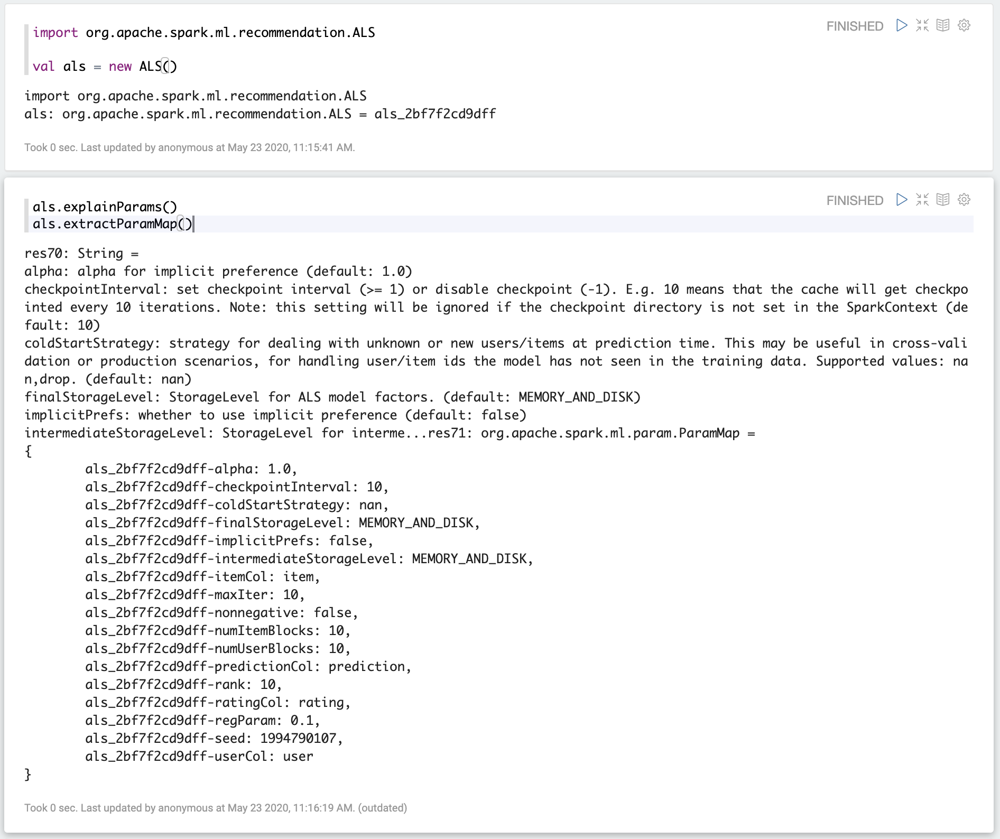

In [23]:
Image('./capture/17_reco.png')

In [ ]:
import org.apache.spark.ml.recommendation.ALS

val als = new ALS()
    .setUserCol("userid")
    .setItemCol("artistid")
    .setRatingCol("playcount")
    .setImplicitPrefs(true)
    .setMaxIter(2)
    .setRegParam(0.1)
    .setAlpha(40)
    .setRank(2)
    .setColdStartStrategy("drop")

### params 내용보기

In [ ]:
als.explainParams()
als.extractParamMap()

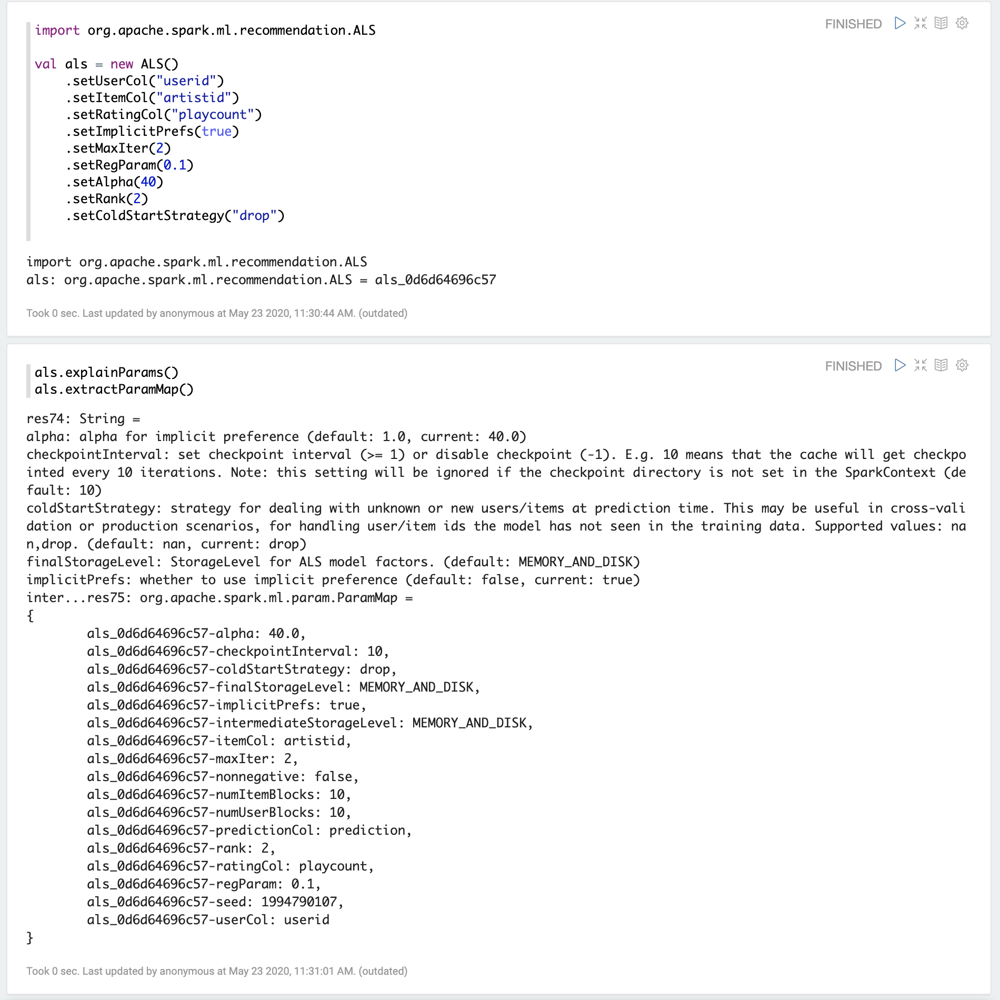

In [25]:
Image('./capture/18_reco.png')

### ALS 알고리즘 학습

In [ ]:
userArtistCSVDF5.printSchema()

val alsModel = als.fit(userArtistCSVDF5)

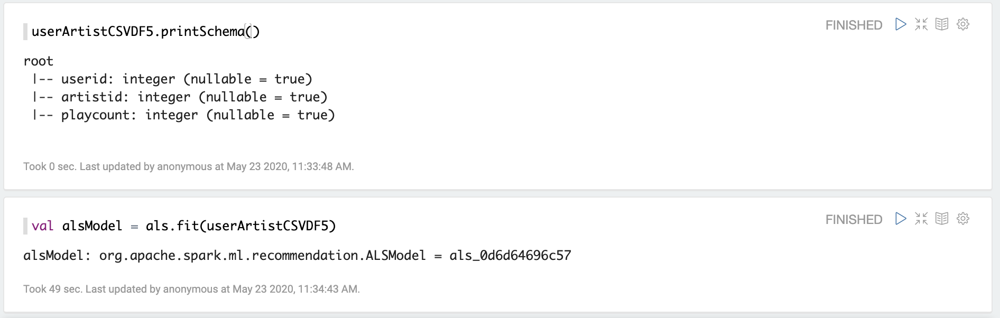

In [26]:
Image('./capture/19_reco.png')

### Exist User & New User , ALS Model로 추천

In [ ]:
val userDS = Seq(2093760, 987654321)
    .toDF("userID")
    .as[Int] # Dataset으로 형변환 by.Encoder
    
val recommendedForSomeUsersDF = alsModel.recommendForUserSubset(userDS,5)
recommendedForSomeUsersDF.printSchema()
recommendedForSomeUsersDF.show(false)

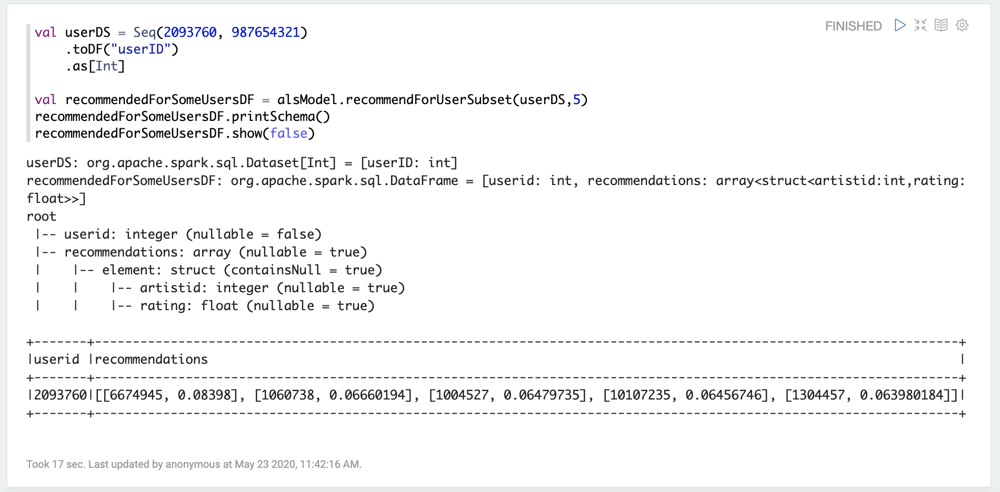

In [27]:
Image('./capture/20_reco.png')

### 모든 사용자에 대해서 추천

In [ ]:
val predictionsDF = alsModel.transform(userArtistCSVDF5)
predictionsDF.printSchema
predictionsDF.show(false)

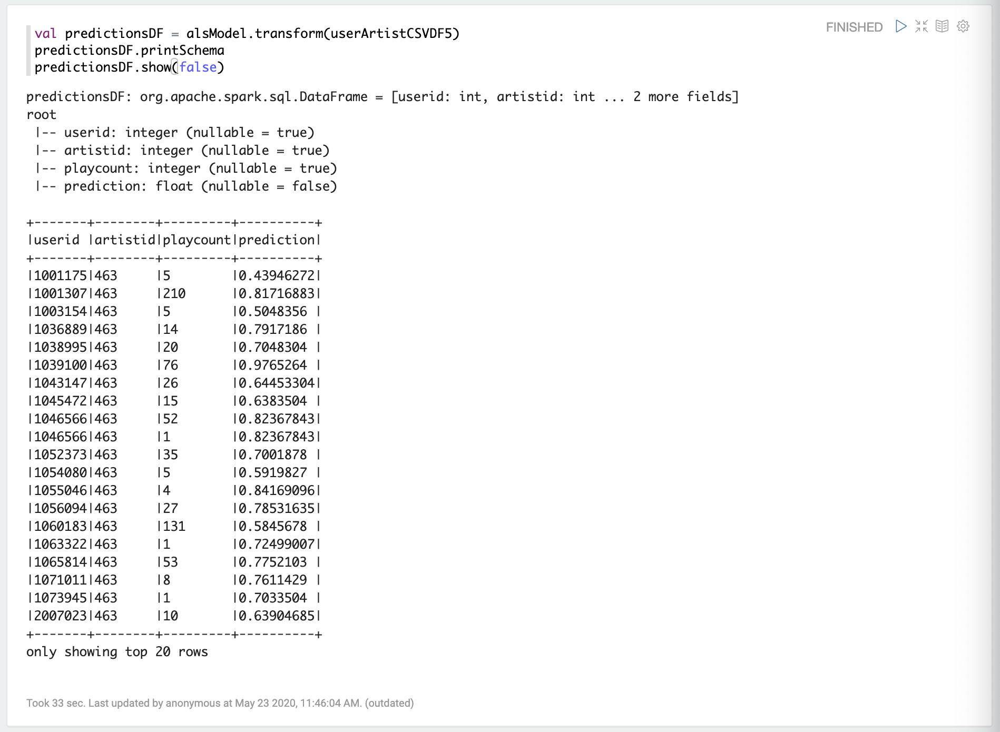

In [28]:
Image('./capture/21_reco.png')

### 모델을 평가하기 위한 Evaluator 정의

In [ ]:
import org.apache.spark.ml.evaluation.RegressionEvaluator

val regEval = new RegressionEvaluator()
    .setLabelCol("playcount")
    .setPredictionCol("prediction")
    .setMetricName("rmse")

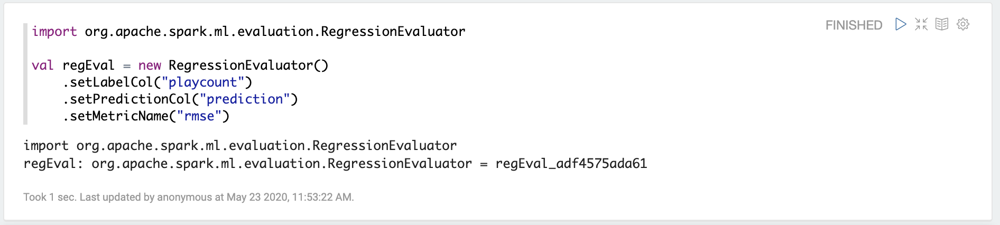

In [30]:
Image('./capture/22_reco.png')

In [ ]:
val rmse = regEval.evaluate(predictionsDF)

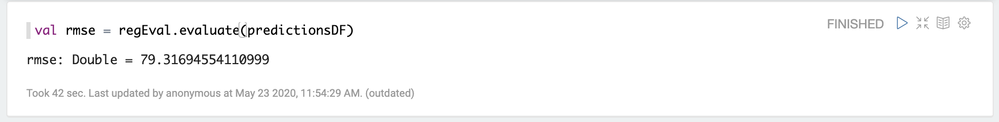

In [31]:
Image('./capture/23_reco.png')

---

### Hyper-Parameter Tuning

 - pipeline 알고리즘 정의 , stage 1개, ALS

In [ ]:
import org.apache.spark.ml.{Pipeline, PipelineModel}

val pipeline = new Pipeline()
    .setStages(Array(als))

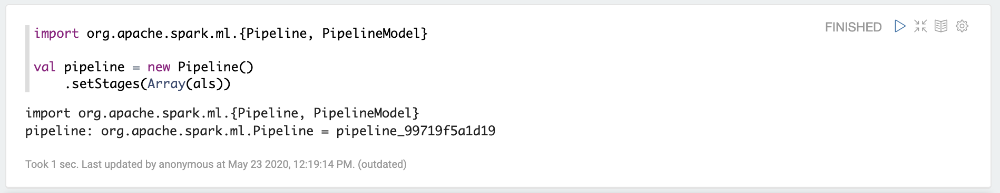

In [32]:
Image('./capture/24_reco.png')

### hyper-parameter 조합을 paramMap으로 구성

In [ ]:
import org.apache.spark.ml.tuning.ParamGridBuilder

val paramMaps = new ParamGridBuilder()
    .addGrid(als.rank, Array(2,3))
    .addGrid(als.regParam, Array(1.0, 0.01))
    .addGrid(als.alpha, Array(40.0, 1.0))
    .build()

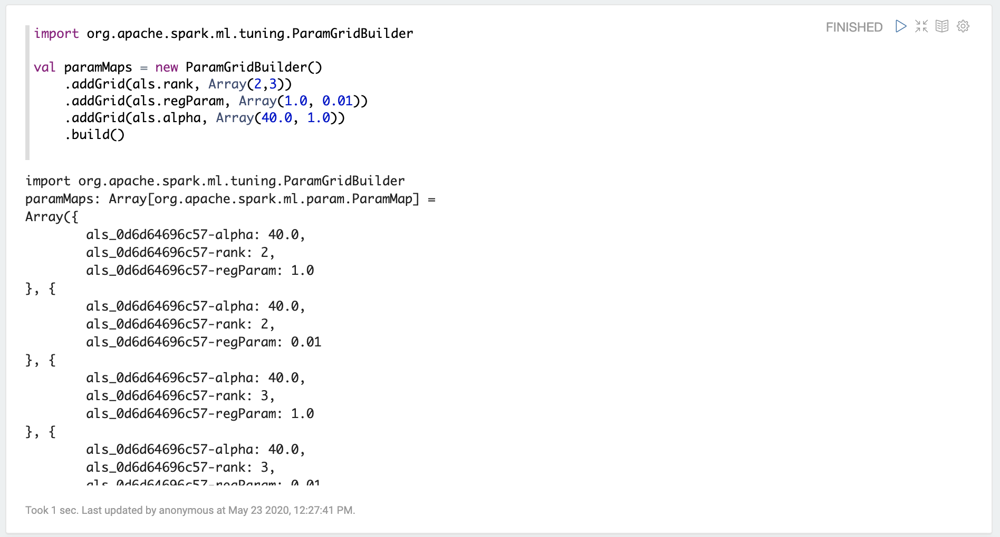

In [34]:
Image('./capture/25_reco.png')

### Define CrossValidator

In [ ]:
import org.apache.spark.ml.tuning.CrossValidator

val cv = new CrossValidator()
    .setEstimator(pipeline) # ML알고리즘 , Pipeline
    .setEstimatorParamMaps(paramMaps) # 튜닝하고자 하는 hyper-parameter 조합
    .setEvaluator(regEval) # 모델 평가자
    .setNumFolds(2) # 데이터를 나누는 기준

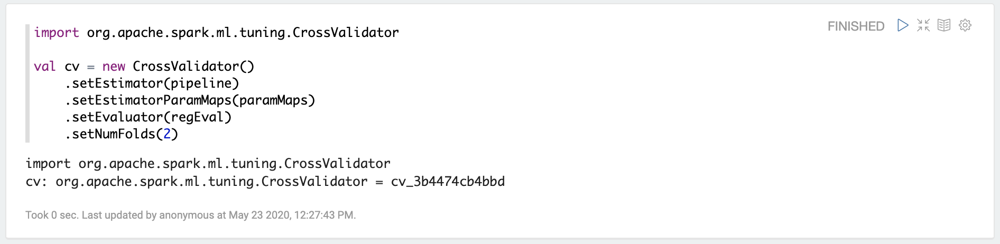

In [35]:
Image('./capture/26_reco.png')

### train data / test data 분리

In [ ]:
val Array(trainDS, testDS) = userArtistCSVDF5.randomSplit(Array(0.3,0.7), 11L)

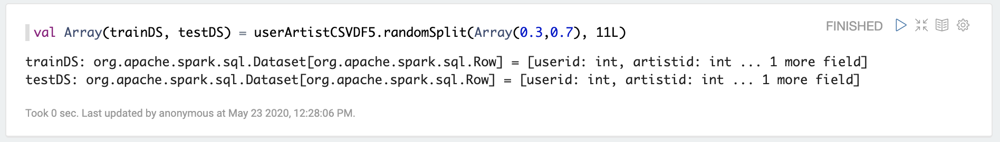

In [36]:
Image('./capture/27_reco.png')

### CrossValidator 학습

In [ ]:
import org.apache.spark.ml.tuning.CrossValidatorModel

val cvModel = cv.fit(trainDS)

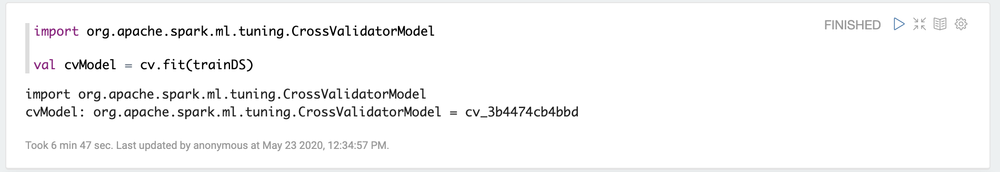

In [37]:
Image('./capture/28_reco.png')

### Best Model 보기

In [ ]:
cvModel.bestModel
cvModel.avgMetrics
cvModel.getEstimatorParamMaps

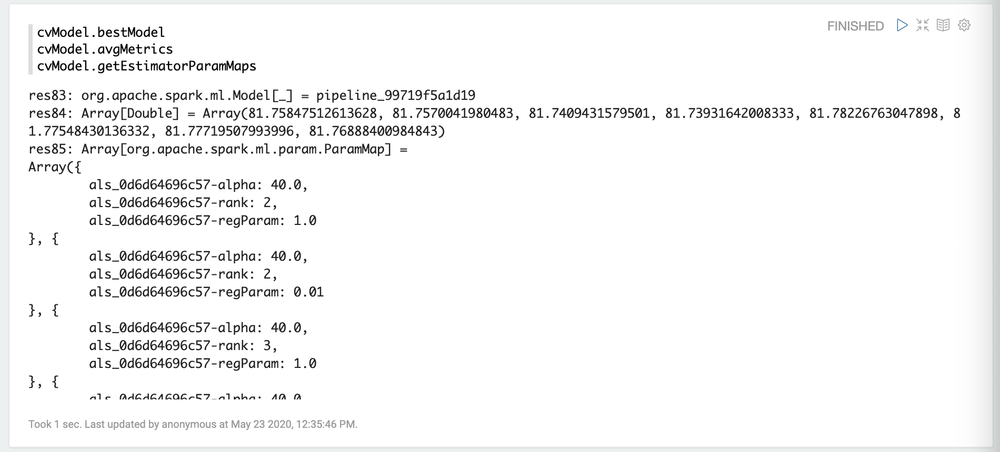

In [38]:
Image('./capture/29_reco.png')

### parameter 조합별 Metric

In [ ]:
cvModel.getEstimatorParamMaps.zip(cvModel.avgMetrics).sortBy(_._2)

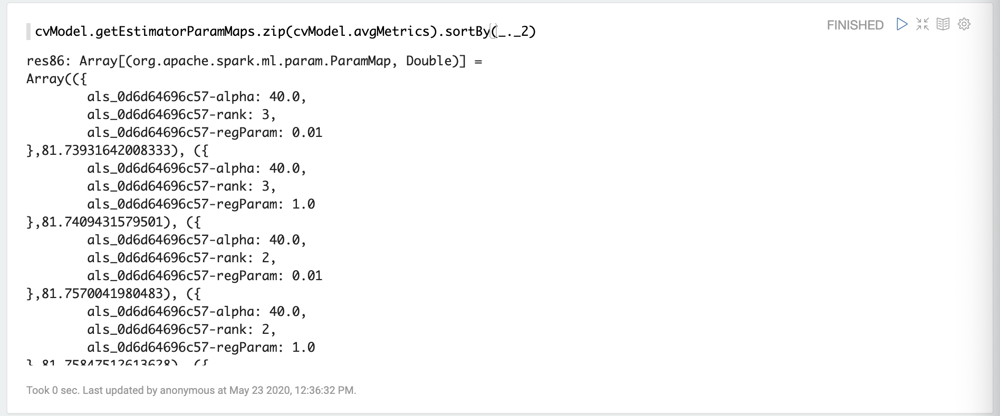

In [39]:
Image('./capture/30_reco.png')

### CrossValidator Model HDFS에 저장

In [ ]:
cvModel.write.overwrite.save("hdfs://hadoop-master-01:9000/kikang/data/audio_als/crossvalidator_model")

 - create directory

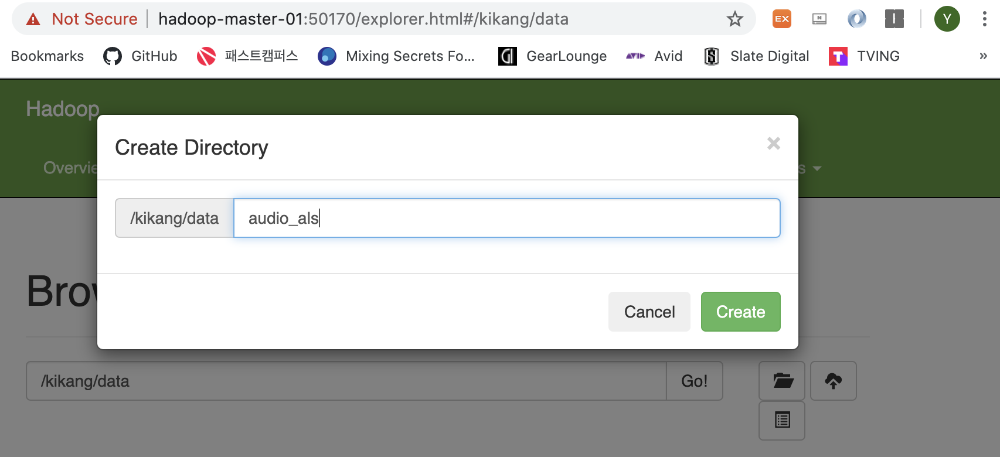

In [40]:
Image('./capture/31_reco.png')

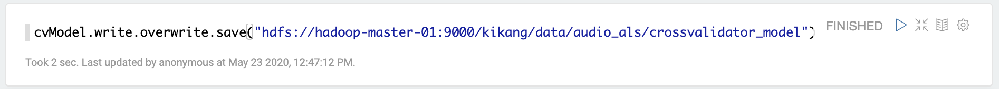

In [42]:
Image('./capture/33_reco.png')

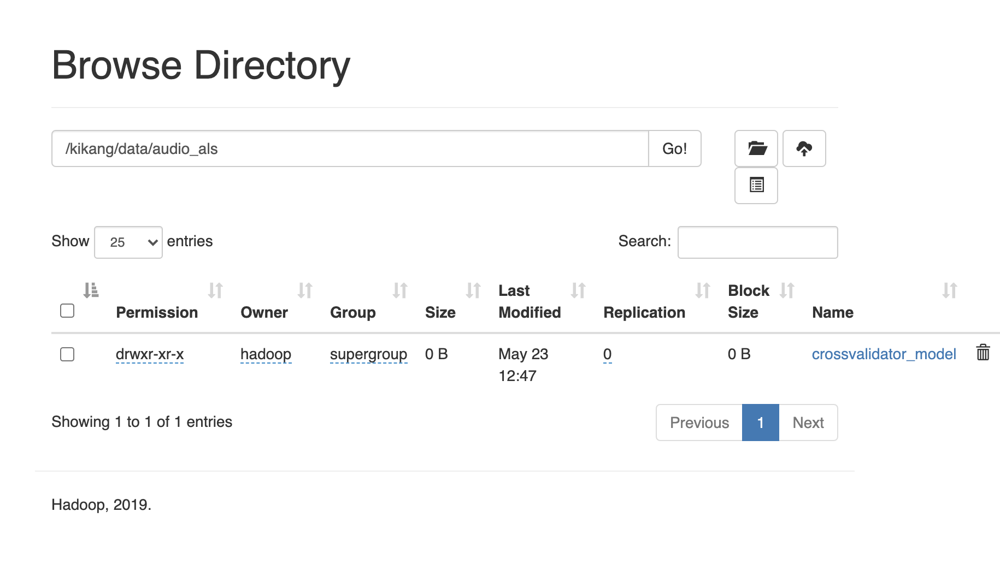

In [41]:
Image('./capture/32_reco.png')

### ALS BEST MODEL을 추출하여 HDFS에 저장

In [ ]:
import org.apache.spark.ml.recommendation._

cvModel
cvModel.bestModel
val pipelineBestModel = cvModel.bestModel.asInstanceOf[PipelineModel]
pipelineBestModel.stages(0)
val alsBestModel = pipelineBestModel.stages(0).asInstanceOf[ALSModel]

# ALS MODEL에 있는 recommendForUserSubset() API와 같은 추천에 특화된 API를 사용하기 위해서
alsBestModel.write.overwrite.save("hdfs://hadoop-master-01:9000/kikang/data/audio_als/als_model")

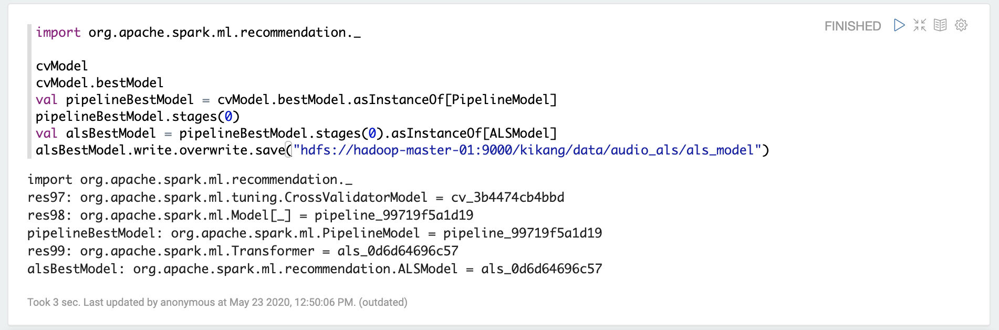

In [43]:
Image('./capture/34_reco.png')

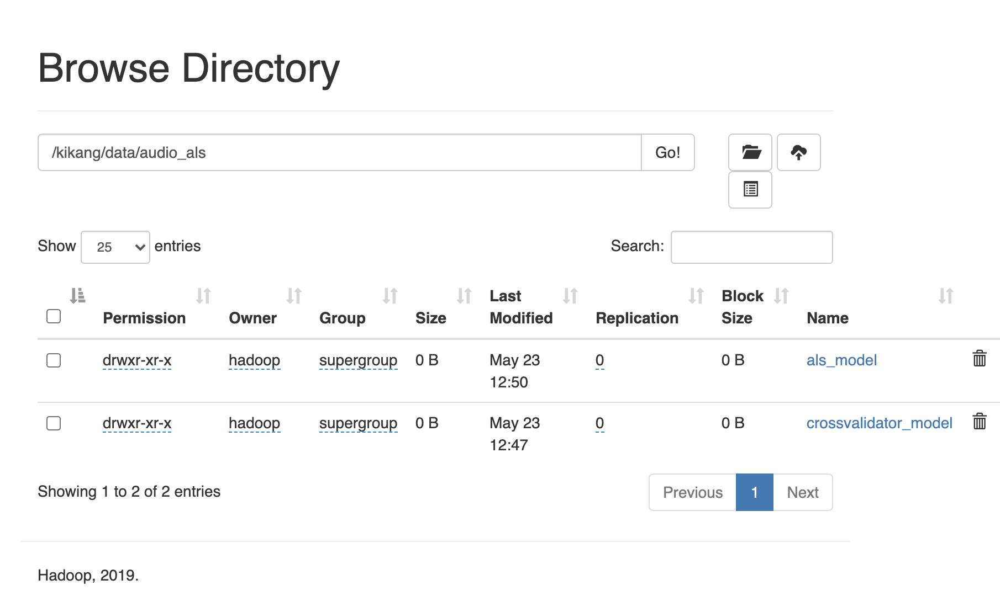

In [44]:
Image('./capture/35_reco.png')

### HDFS에 저장된 BEST ALSMODEL을 로딩하여 보기

In [ ]:
val loadedBestALSModel = ALSModel.load("hdfs://hadoop-master-01:9000/kikang/data/audio_als/als_model")
loadedBestALSModel.extractParamMap

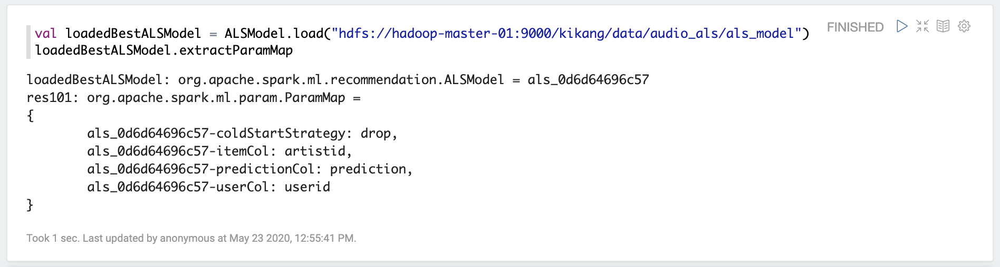

In [46]:
Image('./capture/36_reco.png')

### 로딩된 BEST ALSMODEL로 추천 , ALSModel.recommendForUserSubset(DS)

In [ ]:
val userDS2 = Seq(2093760, 987654321).toDF("userID").as[Int]
val recommendedForUsersDF2 = loadedBestALSModel.recommendForUserSubset(userDS2, 5)

recommendedForSomeUsersDF.printSchema
recommendedForSomeUsersDF.show(false)

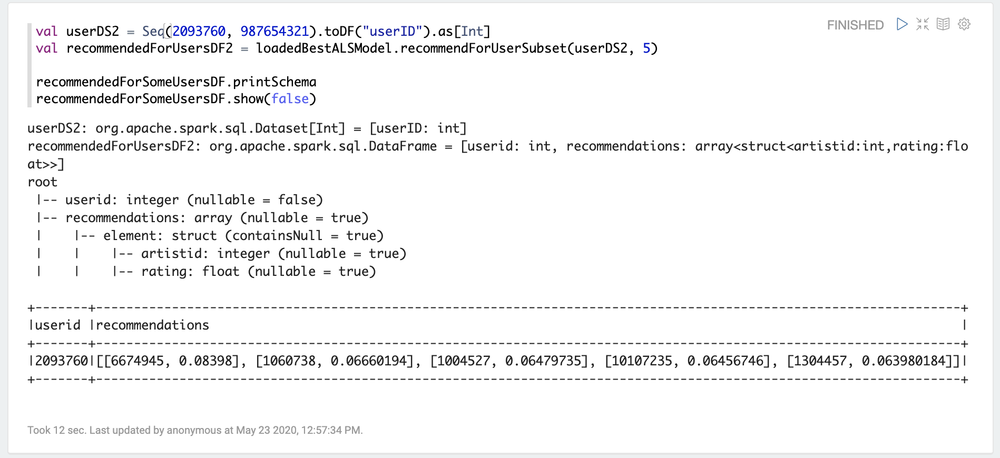

In [45]:
Image('./capture/37_reco.png')